# Movie Production Investment  - Capstone Project - Cecilia Oliveira

#### Table of Contents

This project is divided in the following parts:

In [14]:
table_of_contents = {'Sections': ['1', '2', '3', '4', '5', '6', '', '', '', '', '', '', '7'],
                     '' : ['', '', '', '', '', '', '6.1', '6.1.1', '6.1.2', '6.1.3', '6.2', '6.3', ''],
                     'Titles':['Executive Summary', 'Acquiring Data', 'Data Parsing', 'Data Mining', 'Data Refining', 
                      'Data Model Building', 'Regression Models', 'ROI', 'Vote Average', 'Revenue', 'Classification', 
                      'NLP', 'Results Review']}

table_of_contents = pd.DataFrame(table_of_contents, columns = ['Sections', '', 'Titles'])

table_of_contents.set_index('Sections', inplace=True)
table_of_contents

,,Titles
Sections,,
1,,Executive Summary
2,,Acquiring Data
3,,Data Parsing
4,,Data Mining
5,,Data Refining
6,,Data Model Building
,6.1,Regression Models
,6.1.1,ROI
,6.1.2,Vote Average


## 1. Executive Summary

With the increase of streaming platforms and the consumption of movies  as “fast” culture, I want to analyse a regression and classification model focused on budget, tagline, IMDb voting of films to predict the type of movies would be successful or have a high review score. 


This would be targeted to cultural investors, corporates interested in investing in the arts, film production companies, government cultural departments or even film councils and festivals. 

The success metrics would be revenue, ROI, IMDb score and valid investment.

After fitting regression models on return on investment, vote average and revenue, I have decided to also fit classification models on a new bolean variable created: valid_investment. I have also fitted the classification models seprating train and test randomly and prior to 2011 or not. 

Apart from those, I have also used NLP to review which keywords are more likely used in successful movies.



## 2. Acquiring Data 

The dataset has come from Kaggle: https://www.kaggle.com/rounakbanik/the-movies-dataset?select=movies_metadata.csv and reports on movies from 1902 up to July 2017. It has 45,000 rows and 23 columns.

Firstly, it is important to download all necessary packages. 

In [3]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import pyplot as plt
import pandas_profiling

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
pd.set_option('max_columns', None)
import psycopg2
import sqlite3
import csv
import re
from matplotlib.colors import ListedColormap
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from scipy.stats import norm
import pycountry
from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
import folium
from folium.plugins import MarkerCluster
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn import naive_bayes
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import scikitplot as skplt
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse import hstack
import scipy
from wordcloud import WordCloud, STOPWORDS 
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.base import TransformerMixin
from sklearn.preprocessing import LabelBinarizer, StandardScaler, OneHotEncoder
from sklearn.pipeline import make_pipeline, make_union
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer as Imputer
from sklearn.neural_network import MLPRegressor
from sklearn import metrics

In [15]:
df = pd.read_csv('/Users/ceciliaoliveira/Desktop/GA/archive (2)/movies_metadata.csv', low_memory=False)

## 3. Data Parsing

As the data has now been acquired and saved in my machine, it is time to parse the data, carry out and EDA and decide the best tools and models to fit the data. 

In [3]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


We can see from the beginning that many rows will need to be cleaned as the have many special characters as [], {}, '' and numbers that are not important for our analysis. 

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

In [16]:
df.profile_report()

As the raw data is uploaded, I will create a SQL Database, also saved in my machine for now:

In [44]:
sqlite3.connect('df_sql.db')

In [45]:
conn = sqlite3.connect('df_sql.db')  
c = conn.cursor()

In [7]:
c.execute('''CREATE TABLE MOVIES
             ([adult] text, [belongs_to_collection] text, [budget] float, [genres] text, [homepage] text, 
             [id] integer, [imbd_id] text, [original_language] text, [original_title] text,
             [overview] text, [popularity] float, [poster_path] text, integer, [production_companies] text, 
             [production_countries] text, [release_date] date, [revenue] float, [runtime] float, 
             [spoken_languages] text, [status] text, [tagline] text, [title] INTEGER PRIMARY KEY, [video] boolean,
             [vote_average] float, [vote_count] float)''')

#conn.commit()

In [ ]:
df.to_sql('MOVIES', conn, if_exists='replace', index=False)

For future reference, here is the data dictionary:

In [5]:
data_dictionary = {'Column_Name': ['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id', 'imdb_id', 
                                  'original_language', 'original_title', 'overview', 'popularity', 'poster_path', 
                                  'production_companies', 'production_countries', 'release_date', 'revenue', 
                                  'runtime', 'spoken_languages', 'status', 'tagline', 'title', 'video', 'vote_average', 
                                  'vote_count'], 'DataType': ['object', 'object', 'object', 'object', 'object', 'object', 
                                                             'object', 'object', 'object', 'object', 'object', 'object', 
                                                             'object', 'object', 'object', 'float64', 'float64', 'object', 
                                                             'object', 'object', 'object', 'object', 'float64', 'float64'], 
                  'Measurement_Unit': ['NA', 'NA', 'USD', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 'NA', 
                                      'NA', 'USD', 'minutes', 'NA', 'Released, Rumored, Post Production, In production, planned, cancelled', 
                                      'NA', 'NA', 'NA', 'NA', 'NA'], 'Description': ['whether the movie is for an adult public', 'if the movie is part of a film franchise', 
                                                                                    'budget allocated for the production of the movie', 'movie type/genre', 'website', 
                                                                                    'unique identification movie number ', 'unique identification movie number in imdb.com', 
                                                                                    'language the movie was created', 'original movie title', 'short description of movie', 
                                                                                    'popularity score ', 'movie poster jpg in website', 'film production company', 'film production company country', 
                                                                                    'cinema date released', 'revenue generated', 'movie duration', 'laguages spoken in movie', 'movie status', 
                                                                                    'movie one liner description', 'movie official title', 'movie website', 'average movie score', ' number of votes the movie has received' ]}

df_data_dictionary = pd.DataFrame(data_dictionary, columns = ['Column_Name', 'DataType', 'Measurement_Unit', 'Description'])
df_data_dictionary

,Column_Name,DataType,Measurement_Unit,Description
0,adult,object,NA,whether the movie is for an adult public
1,belongs_to_collection,object,NA,if the movie is part of a film franchise
2,budget,object,USD,budget allocated for the production of the movie
3,genres,object,NA,movie type/genre
4,homepage,object,NA,website
5,id,object,NA,unique identification movie number
6,imdb_id,object,NA,unique identification movie number in imdb.com
7,original_language,object,NA,language the movie was created
8,original_title,object,NA,original movie title
9,overview,object,NA,short description of movie


And the shape of the data is: 

In [17]:
df.shape

(45466, 24)

I will now clean the data inside the dataframe as many have references and numbers or other caracters that are irrelevant to the analysis.

In [17]:
df_collection = df['belongs_to_collection'].str.split("'name':", expand=True)
df_collection = df_collection[1].str.split(',', expand=True)
df_collection = df_collection[0].str.split("'", expand=True)
df_collection.head()

,0,1,2
0,,Toy Story Collection,
1,NaN,NaN,NaN
2,,Grumpy Old Men Collection,
3,NaN,NaN,NaN
4,,Father of the Bride Collection,


In [18]:
df['belongs_to_collection'] = df_collection[1]
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,Toy Story Collection,30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,Grumpy Old Men Collection,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,Father of the Bride Collection,0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


To cut a few steps, I have used Regex in a few columns:

In [19]:
df['genres'] = df['genres'].str.extract(r'\b(?!(?:name\b)|(?:id\b)|(?:\d+\b))((?:(?![×Þß÷þø])[-A-Za-zÀ-ÿ]|\s)+)')
df.head(2)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,Toy Story Collection,30000000,Animation,http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,Adventure,NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0


In [20]:
df['production_companies'] = df['production_companies'].str.extract(r'\b(?!(?:name\b)|(?:id\b)|(?:\d+\b))((?:(?![×Þß÷þø])[-A-Za-zÀ-ÿ]|\s)+)')
df.head(2)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,Toy Story Collection,30000000,Animation,http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,Adventure,NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,TriStar Pictures,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0


In [21]:
df_countries = df['production_countries'].str.split("'iso_3166_1':", expand=True)
df_countries = df_countries[1].str.split("'name':", expand=True)
df_countries = df_countries[1].str.split("'", expand=True)
df_countries.head()

,0,1,2
0,,United States of America,}]
1,,United States of America,}]
2,,United States of America,}]
3,,United States of America,}]
4,,United States of America,}]


In [22]:
df.production_countries = df_countries[1]
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,Toy Story Collection,30000000,Animation,http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,Adventure,NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,Grumpy Old Men Collection,0,Romance,NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,Warner Bros,United States of America,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,Comedy,NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,Father of the Bride Collection,0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,Sandollar Productions,United States of America,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [23]:
df_language = df['spoken_languages'].str.split("'iso_639_1':", expand=True)
df_language = df_language[1].str.split("'name':", expand=True)
df_language = df_language[0].str.split("'", expand=True)
df_language.head()

,0,1,2
0,,en,","
1,,en,","
2,,en,","
3,,en,","
4,,en,","


In [24]:
df['spoken_languages'] = df_language[1]
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,Toy Story Collection,30000000,Animation,http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,en,Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,Adventure,NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,en,Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,Grumpy Old Men Collection,0,Romance,NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,Warner Bros,United States of America,1995-12-22,0.0,101.0,en,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,Comedy,NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,en,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,Father of the Bride Collection,0,Comedy,NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,Sandollar Productions,United States of America,1995-02-10,76578911.0,106.0,en,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


Now it's time to take understand why there are som values missing and how to fix those:

In [25]:
df.genres.unique()

array(['Animation', 'Adventure', 'Romance', 'Comedy', 'Action', 'Family',
       'History', 'Drama', 'Crime', 'Fantasy', 'Science Fiction', nan,
       'Thriller', 'Music', 'Horror', 'Documentary', 'Mystery', 'Western',
       'TV Movie', 'War', 'Foreign', 'Carousel Productions', 'Aniplex',
       'Odyssey Media'], dtype=object)

Carousel Productions, Aniplex and Odyssey Media are in the wrong column. These will be deleted. 

In [26]:
df = df[df.genres != 'Carousel Productions']
df = df[df.genres != 'Aniplex']
df = df[df.genres != 'Odyssey Media']
df.genres.unique()

array(['Animation', 'Adventure', 'Romance', 'Comedy', 'Action', 'Family',
       'History', 'Drama', 'Crime', 'Fantasy', 'Science Fiction', nan,
       'Thriller', 'Music', 'Horror', 'Documentary', 'Mystery', 'Western',
       'TV Movie', 'War', 'Foreign'], dtype=object)

In [27]:
df.belongs_to_collection.fillna('NoCollection', inplace=True)
df.genres.fillna('None', inplace=True)
df.imdb_id.fillna('None', inplace=True)
df.original_language.fillna('Not Available', inplace=True)
df.overview.fillna('Not Available', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45463 non-null  object 
 1   belongs_to_collection  45463 non-null  object 
 2   budget                 45463 non-null  object 
 3   genres                 45463 non-null  object 
 4   homepage               7779 non-null   object 
 5   id                     45463 non-null  object 
 6   imdb_id                45463 non-null  object 
 7   original_language      45463 non-null  object 
 8   original_title         45463 non-null  object 
 9   overview               45463 non-null  object 
 10  popularity             45460 non-null  object 
 11  poster_path            45077 non-null  object 
 12  production_companies   33565 non-null  object 
 13  production_countries   39178 non-null  object 
 14  release_date           45376 non-null  object 
 15  re

As the popularity, release and runtime date of the film is important to the analysis, we will only keep those that have a value.

In [28]:
df = df[df['popularity'].notna()]
df = df[df['release_date'].notna()]
df = df[df['runtime'].notna()]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45130 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45130 non-null  object 
 1   belongs_to_collection  45130 non-null  object 
 2   budget                 45130 non-null  object 
 3   genres                 45130 non-null  object 
 4   homepage               7766 non-null   object 
 5   id                     45130 non-null  object 
 6   imdb_id                45130 non-null  object 
 7   original_language      45130 non-null  object 
 8   original_title         45130 non-null  object 
 9   overview               45130 non-null  object 
 10  popularity             45130 non-null  object 
 11  poster_path            44808 non-null  object 
 12  production_companies   33469 non-null  object 
 13  production_countries   39021 non-null  object 
 14  release_date           45130 non-null  object 
 15  re

And will drop the homepage and poster path as those are irrelevant for the analysis. 

In [29]:
df.drop('homepage', axis=1, inplace=True)
df.drop('poster_path', axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45130 entries, 0 to 45465
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45130 non-null  object 
 1   belongs_to_collection  45130 non-null  object 
 2   budget                 45130 non-null  object 
 3   genres                 45130 non-null  object 
 4   id                     45130 non-null  object 
 5   imdb_id                45130 non-null  object 
 6   original_language      45130 non-null  object 
 7   original_title         45130 non-null  object 
 8   overview               45130 non-null  object 
 9   popularity             45130 non-null  object 
 10  production_companies   33469 non-null  object 
 11  production_countries   39021 non-null  object 
 12  release_date           45130 non-null  object 
 13  revenue                45130 non-null  float64
 14  runtime                45130 non-null  float64
 15  sp

I will, however, keep the movies without production companies, countries, language, status and tagline as this could be an extra analysis point. 

In [30]:
df.production_companies.fillna('Not Available', inplace=True)
df.production_countries.fillna('Not Available', inplace=True)
df.spoken_languages.fillna('Not Available', inplace=True)
df.status.fillna('Not Available', inplace=True)
df.tagline.fillna('Not Available', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45130 entries, 0 to 45465
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45130 non-null  object 
 1   belongs_to_collection  45130 non-null  object 
 2   budget                 45130 non-null  object 
 3   genres                 45130 non-null  object 
 4   id                     45130 non-null  object 
 5   imdb_id                45130 non-null  object 
 6   original_language      45130 non-null  object 
 7   original_title         45130 non-null  object 
 8   overview               45130 non-null  object 
 9   popularity             45130 non-null  object 
 10  production_companies   45130 non-null  object 
 11  production_countries   45130 non-null  object 
 12  release_date           45130 non-null  object 
 13  revenue                45130 non-null  float64
 14  runtime                45130 non-null  float64
 15  sp

In [31]:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce')
df['popularity'] = pd.to_numeric(df['popularity'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45130 entries, 0 to 45465
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45130 non-null  object 
 1   belongs_to_collection  45130 non-null  object 
 2   budget                 45130 non-null  int64  
 3   genres                 45130 non-null  object 
 4   id                     45130 non-null  object 
 5   imdb_id                45130 non-null  object 
 6   original_language      45130 non-null  object 
 7   original_title         45130 non-null  object 
 8   overview               45130 non-null  object 
 9   popularity             45130 non-null  float64
 10  production_companies   45130 non-null  object 
 11  production_countries   45130 non-null  object 
 12  release_date           45130 non-null  object 
 13  revenue                45130 non-null  float64
 14  runtime                45130 non-null  float64
 15  sp

I will also create new columns for year, month and date of movie release for future analysis. 

In [32]:
df_date = df['release_date'].str.split('-', expand=True)
df_date.head()

,0,1,2
0,1995,10,30
1,1995,12,15
2,1995,12,22
3,1995,12,22
4,1995,02,10


In [33]:
df['year_release'] = df_date[0]
df['month_release'] = df_date[1]
df['day_release'] = df_date[2]
df.head(3)

,adult,belongs_to_collection,budget,genres,id,imdb_id,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,year_release,month_release,day_release
0,False,Toy Story Collection,30000000,Animation,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,en,Released,Not Available,Toy Story,False,7.7,5415.0,1995,10,30
1,False,NoCollection,65000000,Adventure,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,en,Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,1995,12,15
2,False,Grumpy Old Men Collection,0,Romance,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,Warner Bros,United States of America,1995-12-22,0.0,101.0,en,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,1995,12,22


In [34]:
df['year_release'] = pd.to_numeric(df['year_release'], errors='coerce')
df['month_release'] = pd.to_numeric(df['month_release'], errors='coerce')
df['day_release'] = pd.to_numeric(df['day_release'], errors='coerce')

It will also not be necessary to keep the video, id and imdb_id columns for this exercise. 

In [35]:
df.drop('video', axis=1, inplace=True)
df.drop('id', axis=1, inplace=True)
df.drop('imdb_id', axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45130 entries, 0 to 45465
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45130 non-null  object 
 1   belongs_to_collection  45130 non-null  object 
 2   budget                 45130 non-null  int64  
 3   genres                 45130 non-null  object 
 4   original_language      45130 non-null  object 
 5   original_title         45130 non-null  object 
 6   overview               45130 non-null  object 
 7   popularity             45130 non-null  float64
 8   production_companies   45130 non-null  object 
 9   production_countries   45130 non-null  object 
 10  release_date           45130 non-null  object 
 11  revenue                45130 non-null  float64
 12  runtime                45130 non-null  float64
 13  spoken_languages       45130 non-null  object 
 14  status                 45130 non-null  object 
 15  ta

As the return on investment is important here, so is the budget and revenue. If those are null, we will not keep the movie in the dataframe. It is now time to create a new df which is cleaned after all the process above. 

In [36]:
df_clean = df[df['budget'] !=0]
df_clean = df_clean[df_clean['revenue'] !=0]
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5380 entries, 0 to 45422
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  5380 non-null   object 
 1   belongs_to_collection  5380 non-null   object 
 2   budget                 5380 non-null   int64  
 3   genres                 5380 non-null   object 
 4   original_language      5380 non-null   object 
 5   original_title         5380 non-null   object 
 6   overview               5380 non-null   object 
 7   popularity             5380 non-null   float64
 8   production_companies   5380 non-null   object 
 9   production_countries   5380 non-null   object 
 10  release_date           5380 non-null   object 
 11  revenue                5380 non-null   float64
 12  runtime                5380 non-null   float64
 13  spoken_languages       5380 non-null   object 
 14  status                 5380 non-null   object 
 15  tag

Also, it was necessary to readjust revenue and budget accordingly to inflation. I am therefore importing a CPI package that, once updated, can be applied in a "def function" and readjuted values. 

In [37]:
import cpi

In [38]:
cpi.update()

In [39]:
def inflate_column(data, column):
    return data.apply(lambda x: cpi.inflate(x[column], x.year_release), axis=1)

As discussed in the beginning of this notebook, we want to analyse the ROI (Return on Investment) and we therefore need to calculate it:

In [40]:
df_clean['readjusted_revenue'] = inflate_column(df_clean, 'revenue')
df_clean.head(2)

df_clean['readjusted_budget'] = inflate_column(df_clean, 'budget')
df_clean.head(2)

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,readjusted_revenue,readjusted_budget
0,False,Toy Story Collection,30000000,Animation,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,en,Released,Not Available,Toy Story,7.7,5415.0,1995,10,30,6.266516e+08,5.032618e+07
1,False,NoCollection,65000000,Adventure,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,en,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,12,15,4.408527e+08,1.090401e+08


In [41]:
df_ROI = ((df_clean['readjusted_revenue']- df_clean['readjusted_budget']) / df_clean['readjusted_budget'])*100
df_ROI.head()

0    1145.180110
1     304.303460
3     409.075975
5     212.394697
8      83.857631
dtype: float64

In [42]:
df_clean['ROI'] = df_ROI
df_clean.head()

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,readjusted_revenue,readjusted_budget,ROI
0,False,Toy Story Collection,30000000,Animation,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,en,Released,Not Available,Toy Story,7.7,5415.0,1995,10,30,6.266516e+08,5.032618e+07,1145.180110
1,False,NoCollection,65000000,Adventure,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,en,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,12,15,4.408527e+08,1.090401e+08,304.303460
3,False,NoCollection,16000000,Comedy,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,en,Released,Friends are the people who let you be yourself...,Waiting to Exhale,6.1,34.0,1995,12,22,1.366392e+08,2.684063e+07,409.075975
5,False,NoCollection,60000000,Action,en,Heat,"Obsessive master thief, Neil McCauley leads a ...",17.924927,Regency Enterprises,United States of America,1995-12-15,187436818.0,170.0,en,Released,A Los Angeles Crime Saga,Heat,7.7,1886.0,1995,12,15,3.144326e+08,1.006524e+08,212.394697
8,False,NoCollection,35000000,Action,en,Sudden Death,International action superstar Jean Claude Van...,5.231580,Universal Pictures,United States of America,1995-12-22,64350171.0,106.0,en,Released,Terror goes into overtime.,Sudden Death,5.5,174.0,1995,12,22,1.079499e+08,5.871388e+07,83.857631


## 4. Data Mining

I will now take a look at the data to make sure all is cleaned and start feature engineering to fit models later. 

Firstly, it will be interesting to check the correlation between the different variables:

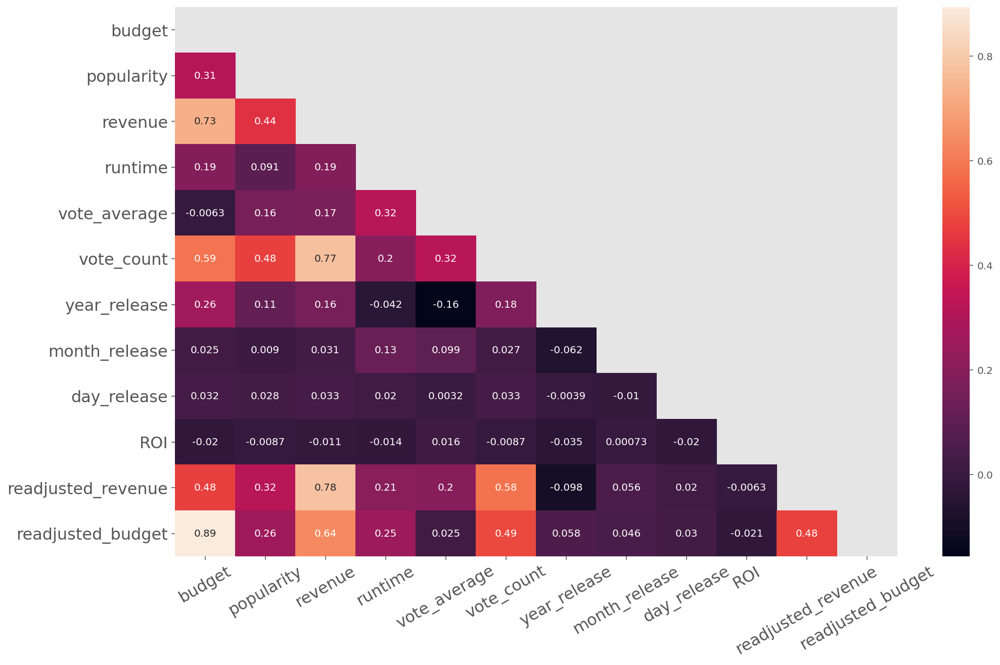

In [33]:
def correlation_heat_map(df_clean):
    corrs = df_clean.corr()

    fig, ax = plt.subplots(figsize=(16, 10))

    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True


    ax = sns.heatmap(corrs, mask=mask, annot=True)

    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=16, rotation=30)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=16, rotation=0)
    return fig, ax



fig, ax = correlation_heat_map(df_clean)

As we can see from the plot above, revenue is heavily correlated to budget and both budget and revenue are also very correlated to number of votes (vote_count). ROI, however is not very correlated to any of the variables, which is a bit disappointing as I was hoping to get more into that analysis. 

<Figure size 576x576 with 0 Axes>

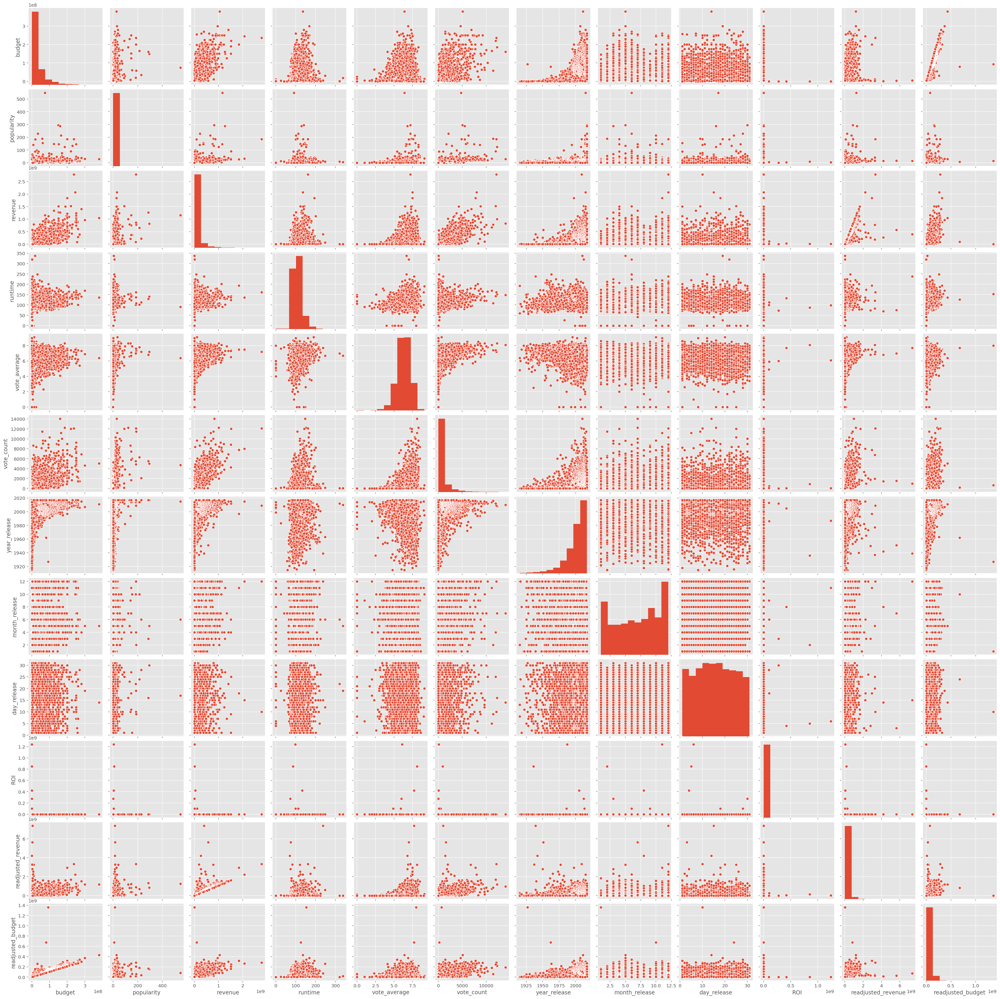

In [34]:
plt.figure(figsize=(8,8))
sns.pairplot(df_clean)
plt.show()

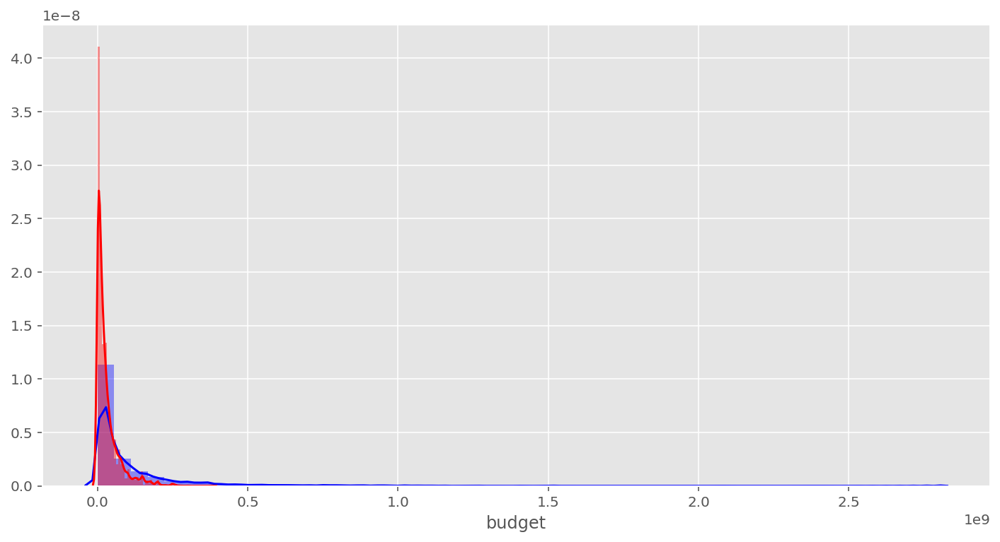

In [35]:
plt.subplots(figsize=(12, 6))
sns.distplot(df_clean['revenue'], color='blue', label = 'revenue')
sns.distplot(df_clean['budget'], color='red', label = 'budget')
plt.show()

## 5. Data Refining 

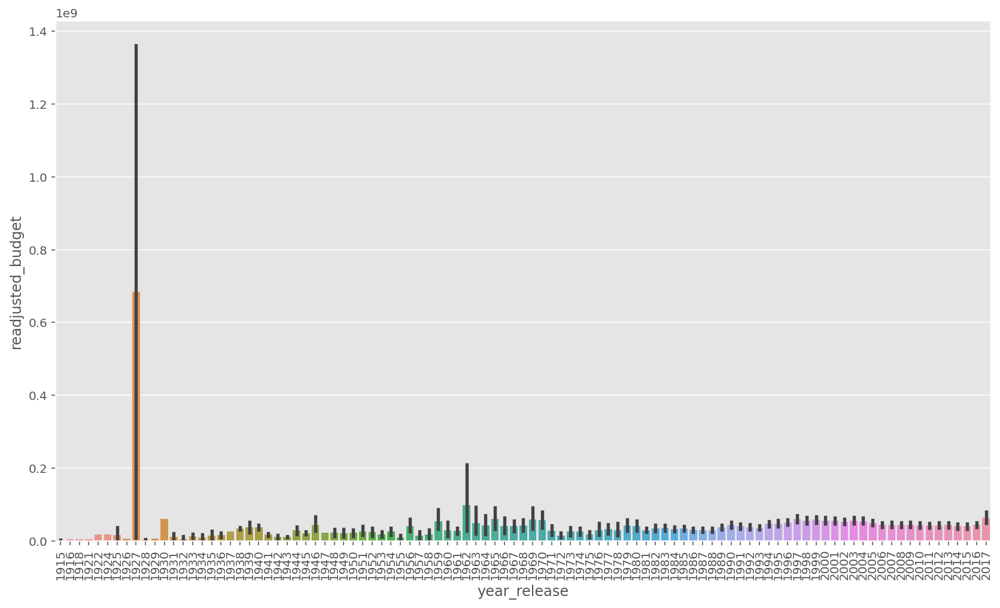

In [37]:
fig = plt.figure(figsize=(14,8))
sns.barplot(x = 'year_release', y='readjusted_budget', data=df_clean)
plt.xticks(rotation=90)
plt.show()

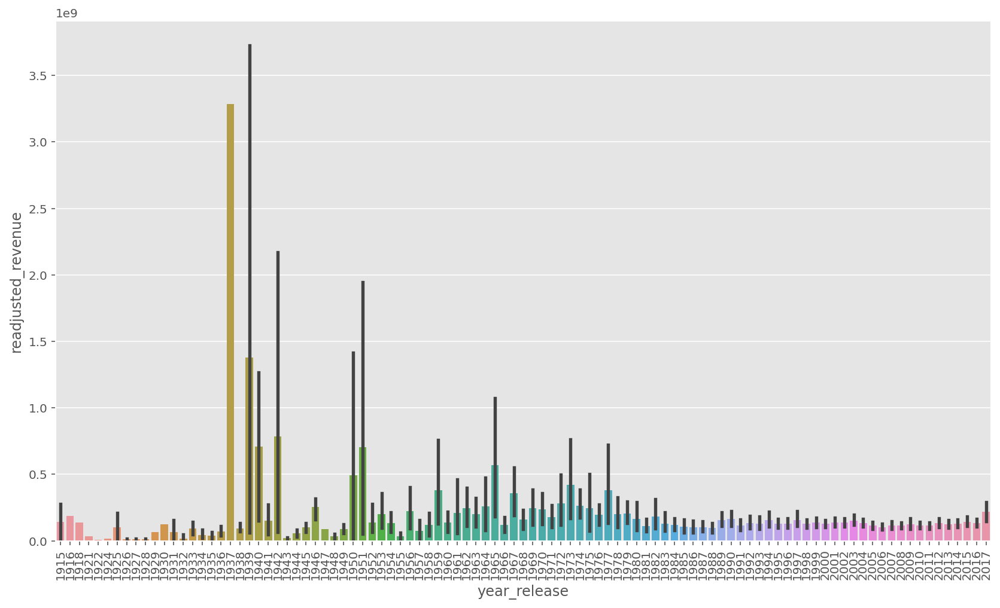

In [38]:
fig = plt.figure(figsize=(14,8))
sns.barplot(x = 'year_release', y='readjusted_revenue', data=df_clean)
plt.xticks(rotation=90)
plt.show()

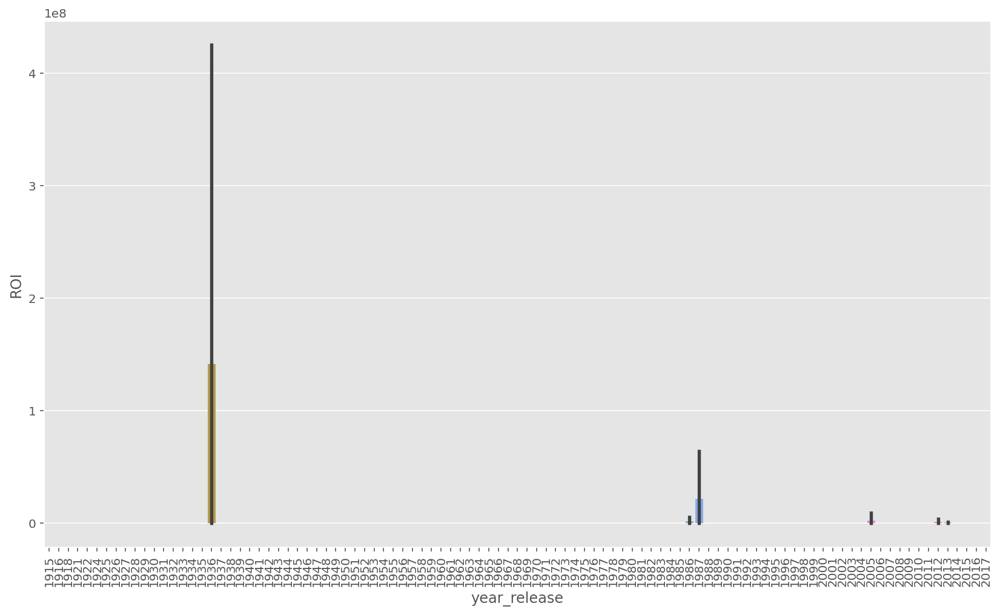

In [39]:
fig = plt.figure(figsize=(14,8))
sns.barplot(x = 'year_release', y='ROI', data=df_clean)
plt.xticks(rotation=90)
plt.show()

From the above plots, we can see that there are a few peaks. Thise are due to very small values either in budget or revenue. I will only therefore consider budgets and revenues above USD 5,000.

In [32]:
df_clean = df_clean[df_clean.budget >= 5000]
df_clean = df_clean[df_clean.revenue >= 5000]
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5298 entries, 0 to 45422
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  5298 non-null   object 
 1   belongs_to_collection  5298 non-null   object 
 2   budget                 5298 non-null   int64  
 3   genres                 5298 non-null   object 
 4   original_language      5298 non-null   object 
 5   original_title         5298 non-null   object 
 6   overview               5298 non-null   object 
 7   popularity             5298 non-null   float64
 8   production_companies   5298 non-null   object 
 9   production_countries   5298 non-null   object 
 10  release_date           5298 non-null   object 
 11  revenue                5298 non-null   float64
 12  runtime                5298 non-null   float64
 13  spoken_languages       5298 non-null   object 
 14  status                 5298 non-null   object 
 15  tag

In the plot year_release vs budget, we see a tall irregularity worth digging a bit:

In [41]:
df_clean.loc[df_clean['year_release'] == 1927]

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,ROI,readjusted_revenue,readjusted_budget
1901,False,NoCollection,92620000,Drama,de,Metropolis,In a futuristic city sharply divided between t...,14.487867,Paramount Pictures,Germany,1927-01-10,650422.0,153.0,xx,Released,There can be no understanding between the hand...,Metropolis,8.0,666.0,1927,1,10,-99.297752,9.556606e+06,1.360859e+09
2907,False,NoCollection,483103,Drama,en,My Best Girl,"Joe Merrill, son of the millionaire owner of a...",0.205671,Mary Pickford Company,United States of America,1927-10-31,1027757.0,80.0,en,Released,Not Available,My Best Girl,8.0,2.0,1927,10,31,112.740761,1.510076e+07,7.098199e+06


Looking at the budget for Metropolis, it seems to have a very high budget, specially for 1927. I will consider this an outlier and drop this film.

In [43]:
df_clean = df_clean[df_clean.title != 'Metropolis']

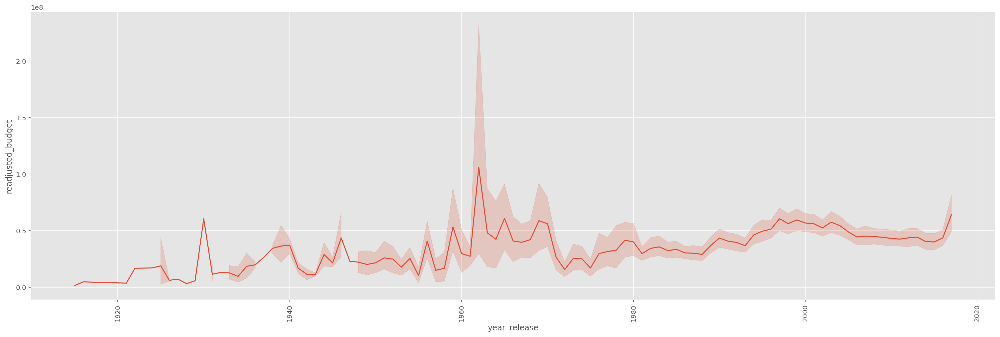

In [45]:
fig = plt.figure(figsize=(26,8))
sns.lineplot(x='year_release', y='readjusted_budget', data=df_clean)
plt.xticks(rotation=90)
plt.show()

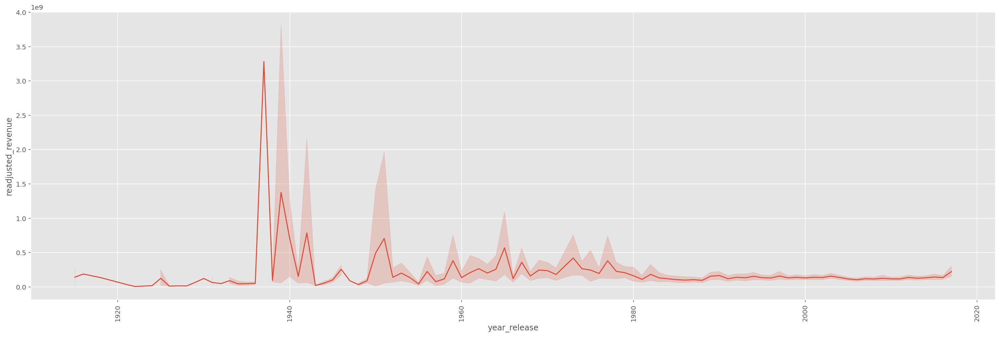

In [46]:
fig = plt.figure(figsize=(26,8))
sns.lineplot(x='year_release', y='readjusted_revenue', data=df_clean)
plt.xticks(rotation=90)
plt.show()

Same here for revenue in 1937, let's see what we find on that year:

In [53]:
df_clean.loc[df_clean['year_release'] == 1937]

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,ROI,readjusted_revenue,readjusted_budget
587,False,NoCollection,1488423,Fantasy,en,Snow White and the Seven Dwarfs,"A beautiful girl, Snow White, takes refuge in ...",16.263878,Walt Disney Productions,United States of America,1937-12-20,184925486.0,83.0,en,Released,"The Happiest, Dopiest, Grumpiest, Sneeziest mo...",Snow White and the Seven Dwarfs,6.9,1973.0,1937,12,20,12324.256142,3.283159e+09,2.642540e+07


In [48]:
df_clean.loc[df_clean['year_release'] == 1938]

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,ROI,readjusted_revenue,readjusted_budget
913,False,NoCollection,2033000,Action,en,The Adventures of Robin Hood,Robin Hood (Errol Flynn) fights nobly for just...,10.685036,Warner Bros,United States of America,1938-05-13,3981000.0,102.0,en,Released,Excitement...Danger...Suspense...as this class...,The Adventures of Robin Hood,7.6,170.0,1938,5,13,95.818987,7.218231e+07,3.686175e+07
1825,False,NoCollection,1644736,Comedy,en,You Can't Take It With You,"Alice, the only relatively normal member of th...",4.370592,Columbia Pictures,United States of America,1938-08-23,7433101.0,126.0,en,Released,YOU'LL LOVE THEM ALL FOR GIVING YOU THE SWELLE...,You Can't Take It With You,7.2,79.0,1938,8,23,351.932772,1.347748e+08,2.982186e+07
8154,False,NoCollection,2000000,Drama,en,Alexander's Ragtime Band,"Roger Grant, a classical violinist, disappoint...",0.632261,Twentieth Century Fox Film Corporation,United States of America,1938-05-24,4000000.0,106.0,en,Released,An American Cavalcade!,Alexander's Ragtime Band,4.8,6.0,1938,5,24,100.000000,7.252681e+07,3.626340e+07


Snow White and the Seven Dwarfs and Yu Can't Take It with You seem to have a very high ROI compared to the other movies. I will also drop them as it is an outlier.

In [44]:
df_clean = df_clean[df_clean.title != 'Snow White and the Seven Dwarfs']

In [45]:
df_clean = df_clean[df_clean.title != "You Can't Take It With You"]

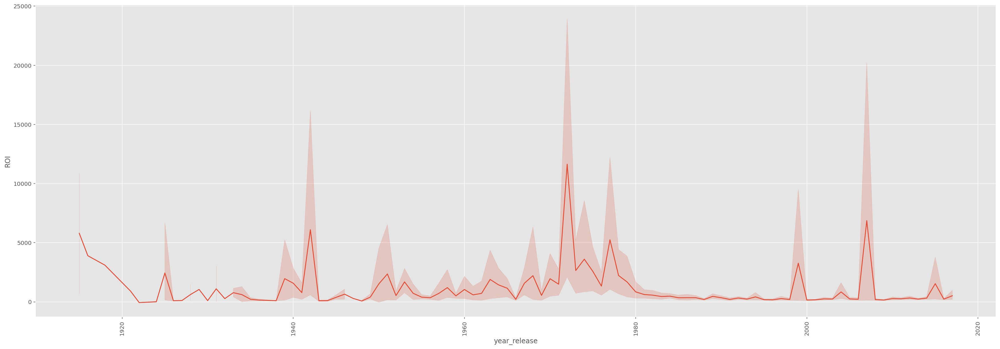

In [57]:
fig = plt.figure(figsize=(30,10))
sns.lineplot(x='year_release', y='ROI', data=df_clean)
plt.xticks(rotation=90)
plt.show()

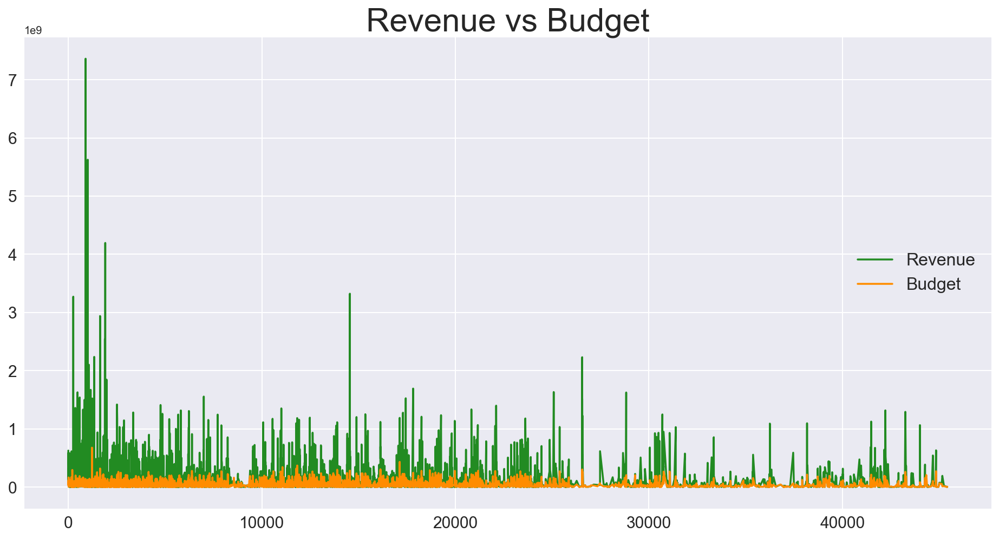

In [61]:
plt.style.use('seaborn')
fig=plt.figure(figsize = (16,8))


revenue = plt.plot('readjusted_revenue', data = df_clean, color = 'forestgreen')
budget = plt.plot('readjusted_budget', data = df_clean, color = 'darkorange')

plt.title('Revenue vs Budget', size = 30)

plt.xlabel('', size = 25)
plt.xticks(size = 15)

plt.ylabel('', size = 25)
plt.yticks(size = 15)

plt.legend(labels = ['Revenue', 'Budget'], prop={"size":16}, loc = 'center right');


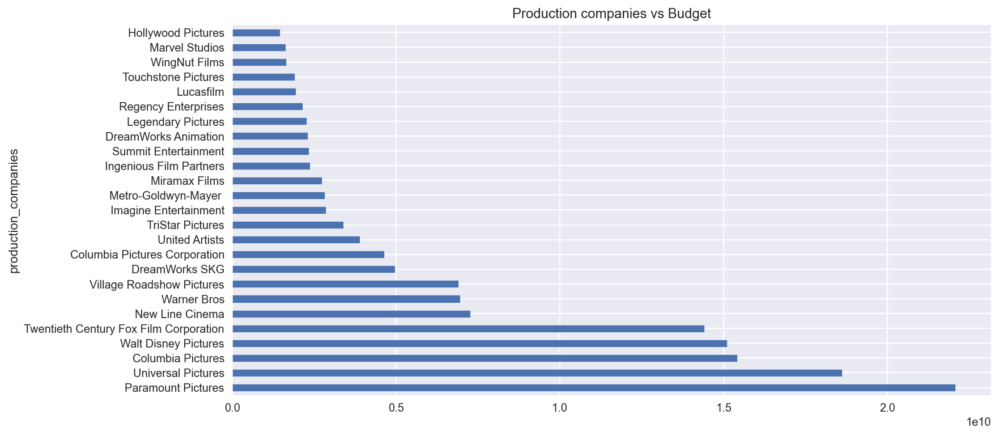

In [62]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Production companies vs Budget')
df_clean.groupby('production_companies')['readjusted_budget'].sum().sort_values(ascending=False).head(25).plot(kind='barh')
plt.show()

The production company with the largest budgets is Paramount Pictures.

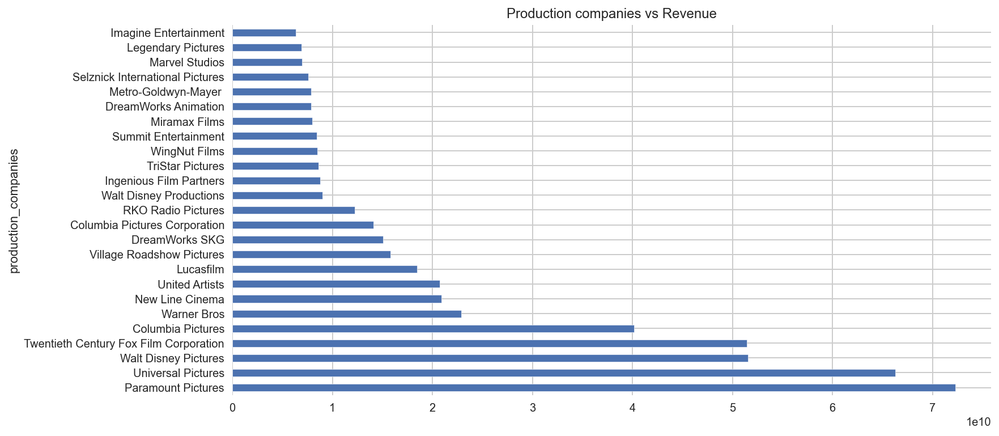

In [63]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Production companies vs Revenue')
df_clean.groupby('production_companies')['readjusted_revenue'].sum().sort_values(ascending=False).head(25).plot(kind='barh')
plt.show()

As well as Revenue. The top 5 in terms of budget and revenue are similar.

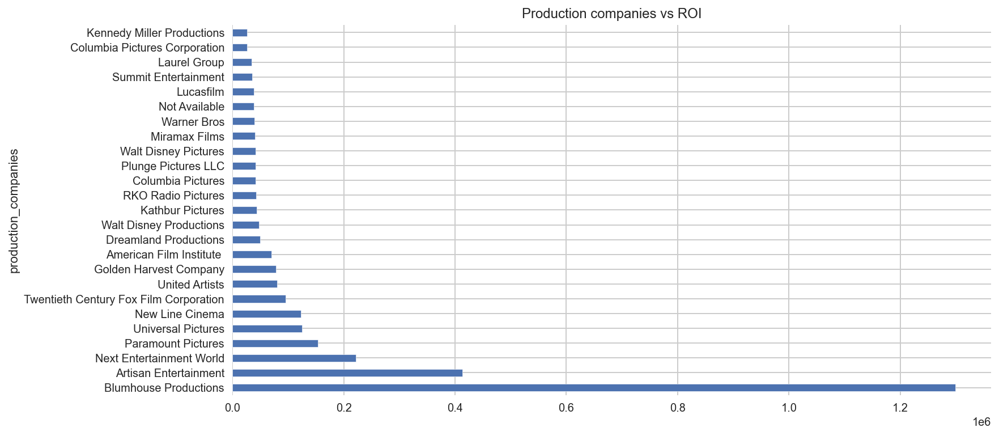

In [64]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Production companies vs ROI')
df_clean.groupby('production_companies')['ROI'].sum().sort_values(ascending=False).head(25).plot(kind='barh')
plt.show()

The ROI, however, is with Blumhouse Productions, Artisan and Next Entertainment World. The "usual suspects" are only after those.

Let's take a look at what Blumhouse has done:

In [65]:
df_clean.loc[df_clean['production_companies'] == 'Blumhouse Productions']

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,ROI,readjusted_revenue,readjusted_budget
14192,False,Paranormal Activity Collection,15000,Horror,en,Paranormal Activity,"After a young, middle class couple moves into ...",12.706424,Blumhouse Productions,United States of America,2007-09-14,193355800.0,86.0,en,Released,What Happens When You Sleep?,Paranormal Activity,5.9,1351.0,2007,9,14,1.288939e+06,2.384117e+08,1.849531e+04
22415,False,Paranormal Activity Collection,5000000,Horror,en,Paranormal Activity: The Marked Ones,Seventeen-year-old Jesse has been hearing terr...,8.898523,Blumhouse Productions,United States of America,2014-01-01,86362372.0,84.0,en,Released,You're one of us now.,Paranormal Activity: The Marked Ones,5.2,455.0,2014,1,1,1.627247e+03,9.326484e+07,5.399622e+06
32174,False,NoCollection,5000000,Thriller,en,The Gift,A husband and wife try to reinvigorate their r...,8.585856,Blumhouse Productions,United States of America,2015-07-30,58978653.0,108.0,en,Released,Not every gift is welcome.,The Gift,6.7,1077.0,2015,7,30,1.079573e+03,6.361698e+07,5.393221e+06
32304,False,NoCollection,5000000,Horror,en,The Visit,The terrifying story of a brother and sister w...,15.021058,Blumhouse Productions,United States of America,2015-09-10,98450062.0,94.0,en,Released,No one loves you like your grandparents.,The Visit,6.0,1405.0,2015,9,10,1.869001e+03,1.061926e+08,5.393221e+06
42169,False,NoCollection,5000000,Mystery,en,Get Out,Chris and his girlfriend Rose go upstate to vi...,36.894806,Blumhouse Productions,United States of America,2017-02-24,252434250.0,104.0,en,Released,"Just because you're invited, doesn't mean you'...",Get Out,7.2,2978.0,2017,2,24,4.948685e+03,2.632857e+08,5.214936e+06
42218,False,NoCollection,5000000,Horror,en,Incarnate,An exorcist comes up against an evil from his ...,15.909181,Blumhouse Productions,United States of America,2016-12-01,6341855.0,91.0,en,Released,Faith Has Failed Us,Incarnate,5.1,142.0,2016,12,1,2.683710e+01,6.755385e+06,5.326032e+06


Most of the movies they have done are horror, including one of my favorites of all times "Get Out".

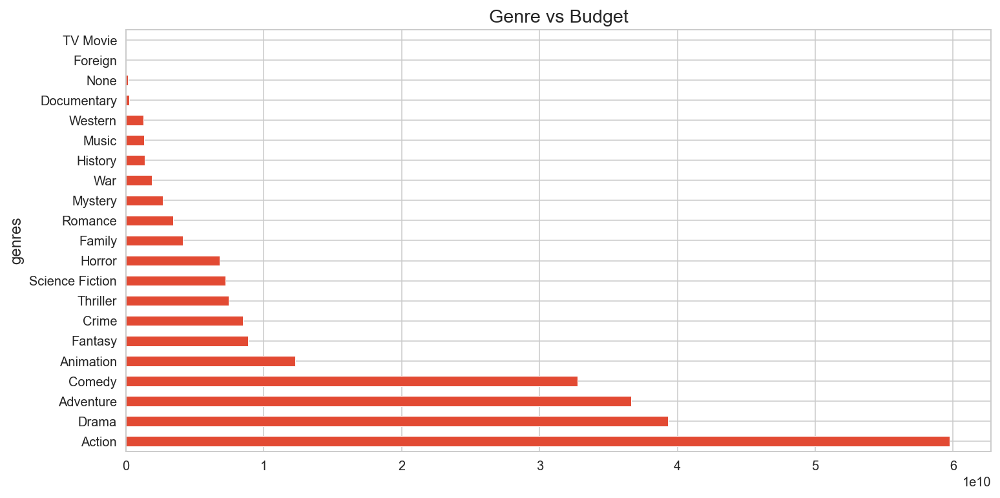

In [168]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Genre vs Budget')
df_clean.groupby('genres')['readjusted_budget'].sum().sort_values(ascending=False).plot(kind='barh')
plt.show()

The genre with the highest budget are, as expected, Action movies. 

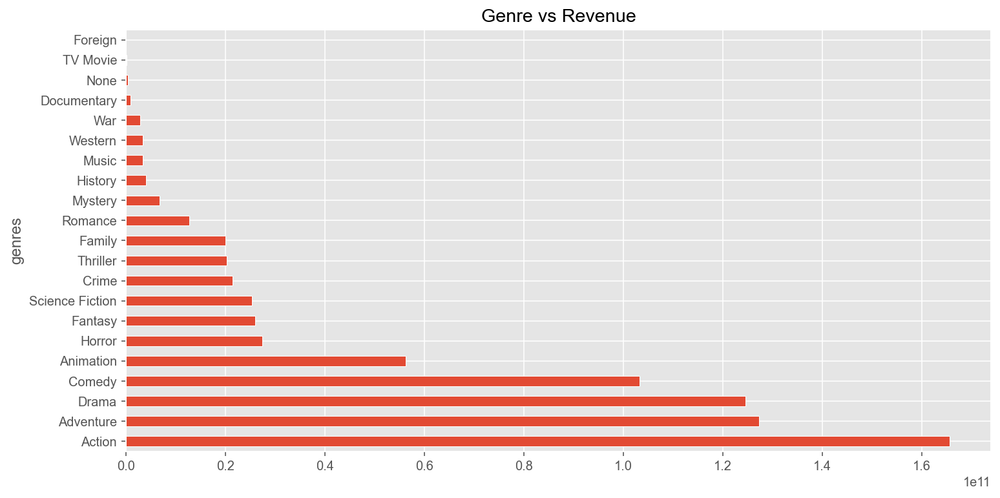

In [167]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Genre vs Revenue')
df_clean.groupby('genres')['readjusted_revenue'].sum().sort_values(ascending=False).plot(kind='barh')
plt.show()

And Action movies are also winners in terms of revenue. 

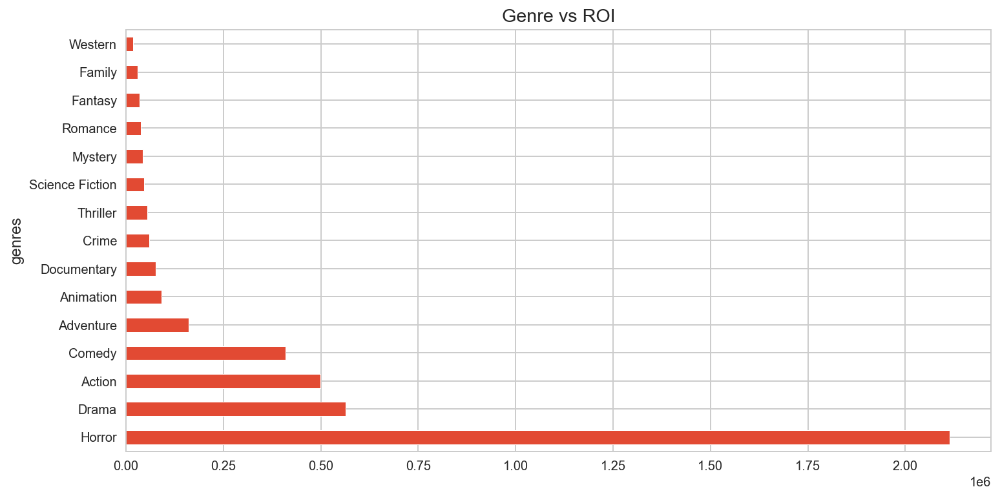

In [181]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Genre vs ROI')
df_clean.groupby('genres')['ROI'].sum().sort_values(ascending=False).head(15).plot(kind='barh')
plt.show()

However, ROI are higher in Horror, Action coming in on 4th place. This is similar to the conclusion we had with production companies ROI. 

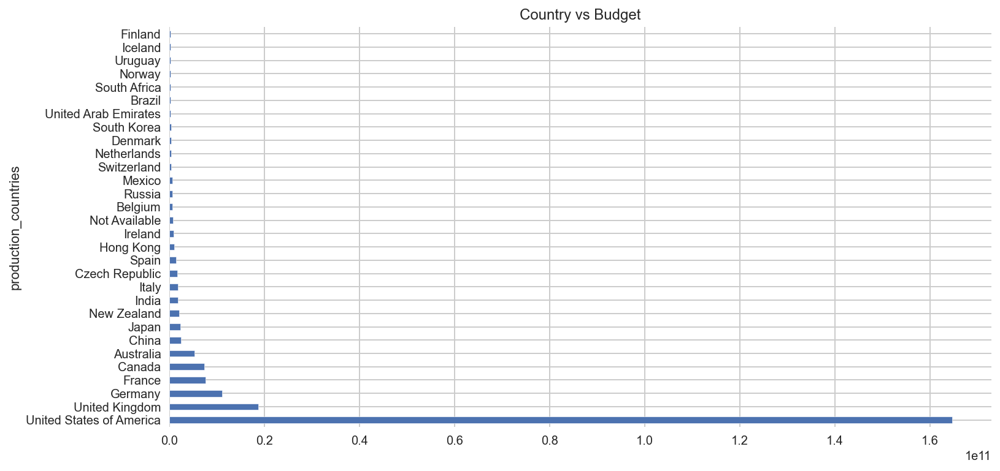

In [69]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Country vs Budget')
df_clean.groupby('production_countries')['readjusted_budget'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

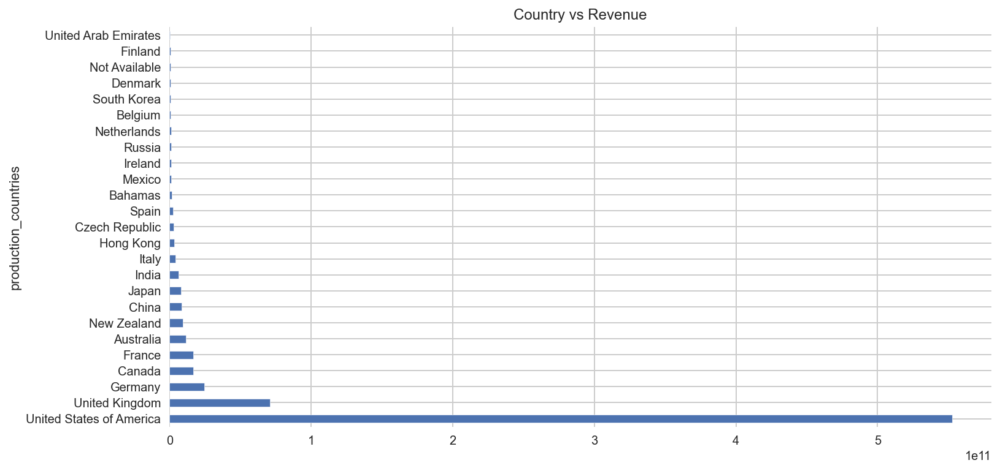

In [70]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Country vs Revenue')
df_clean.groupby('production_countries')['readjusted_revenue'].sum().sort_values(ascending=False).head(25).plot(kind='barh')
plt.show()

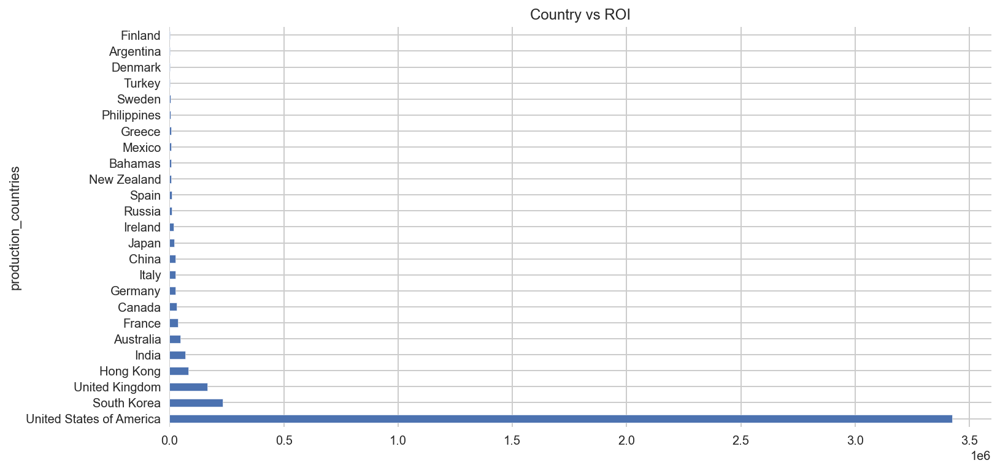

In [71]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Country vs ROI')
df_clean.groupby('production_countries')['ROI'].sum().sort_values(ascending=False).head(25).plot(kind='barh')
plt.show()

Also as expected, USA productions have the largest budgets, revenue and ROI. Although UK is in second in Budget and Revenue, it is not in ROI, being overtaken by South Korea.

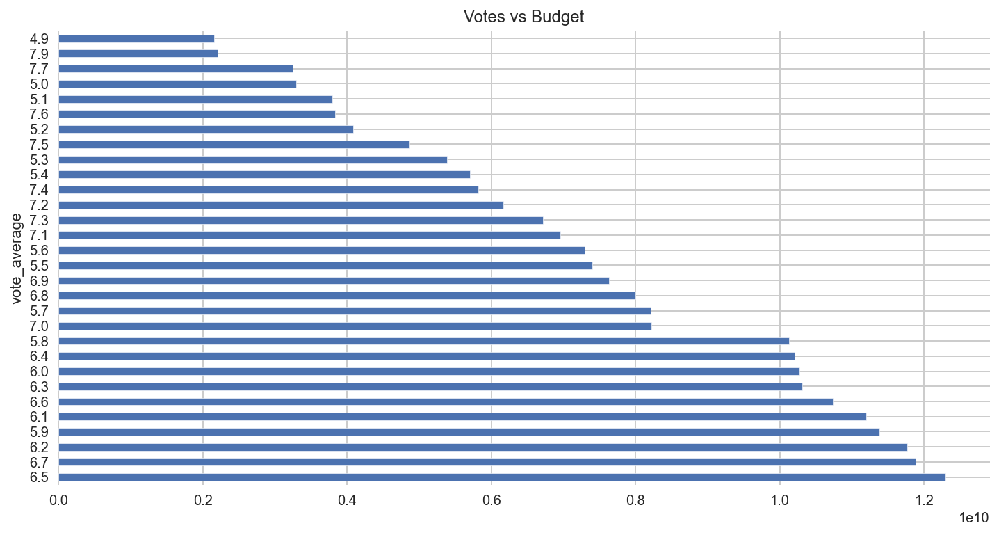

In [72]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Votes vs Budget')
df_clean.groupby('vote_average')['readjusted_budget'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

Movies with the highest budget are not necessaritly the ones that are the most popular. We can see here that the from the top 5, they are all between 5.9 and 6.7

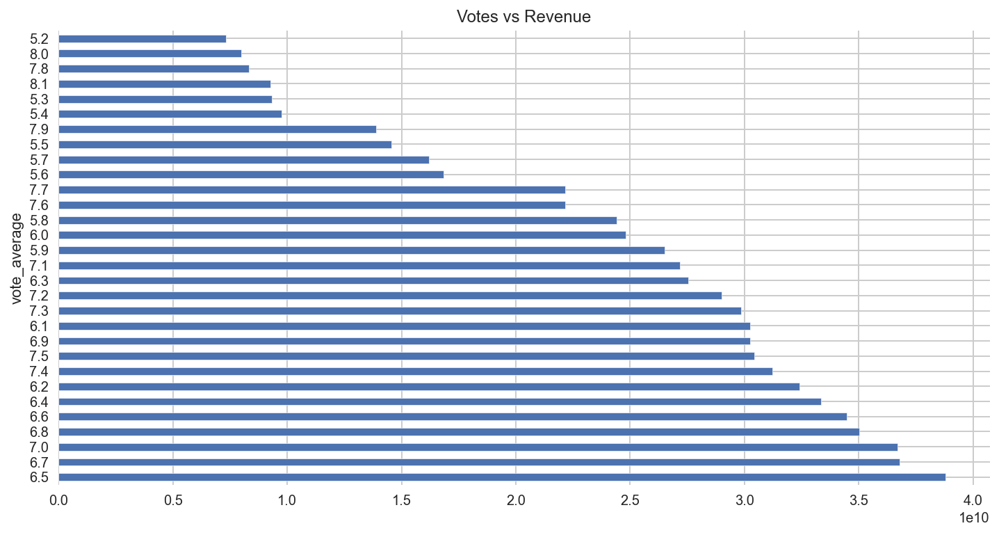

In [73]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Votes vs Revenue')
df_clean.groupby('vote_average')['readjusted_revenue'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

When looking into revenue, it looks similar, with the best revenues between 6.5 and 7.

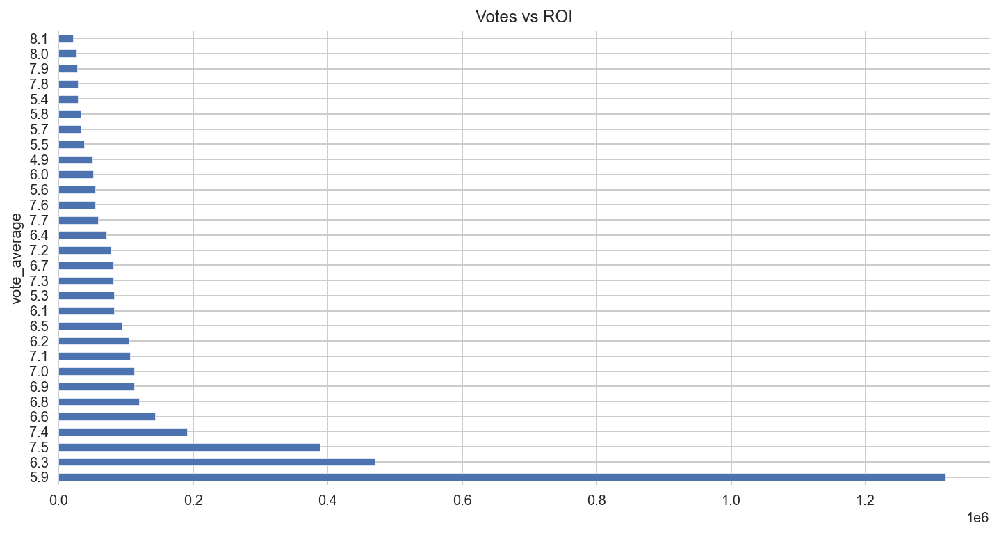

In [74]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Votes vs ROI')
df_clean.groupby('vote_average')['ROI'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

For ROI, 5.9 are great average vote. 

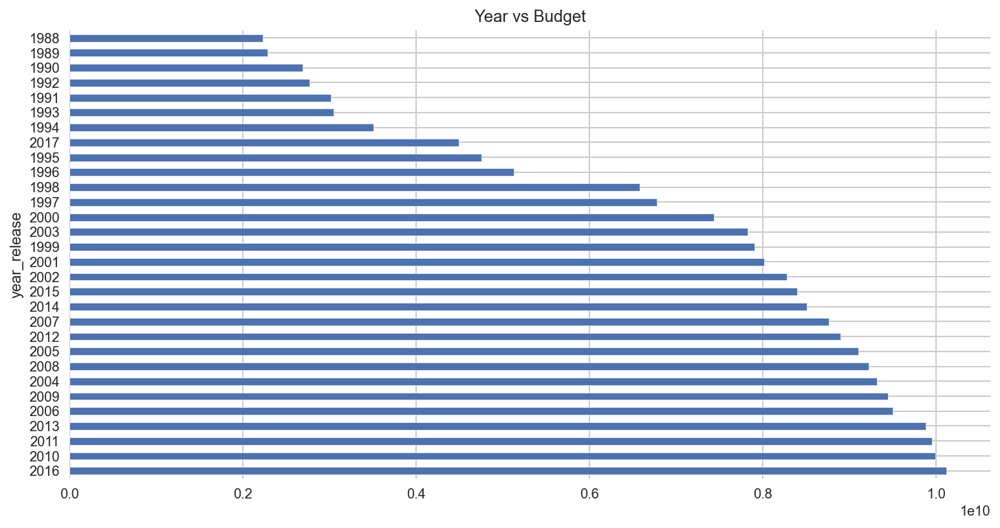

In [75]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Year vs Budget')
df_clean.groupby('year_release')['readjusted_budget'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

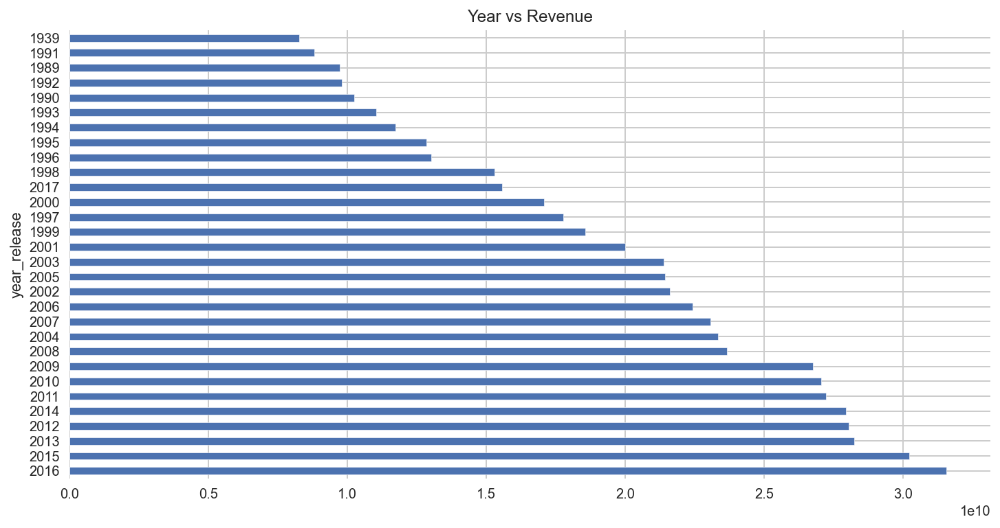

In [76]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Year vs Revenue')
df_clean.groupby('year_release')['readjusted_revenue'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

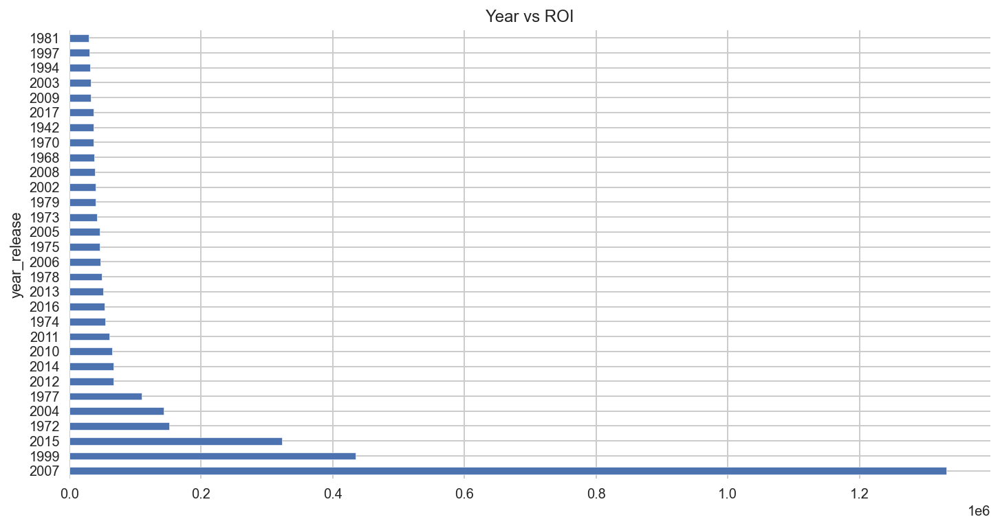

In [77]:
plt.subplots(figsize=(12, 6))
sns.set_style('whitegrid')
plt.title('Year vs ROI')
df_clean.groupby('year_release')['ROI'].sum().sort_values(ascending=False).head(30).plot(kind='barh')
plt.show()

2016 was a great year for budget and revenue but this was collected until 2017 which means that there is a fairly steady increase of budget and revenue YOY. 2007 however had a huge ROI compared to the rest of the years. 

In [36]:
df_clean.loc[df_clean['year_release'] == 2007].sort_values(by= 'ROI', axis=0, ascending=False, 
                                                           inplace=False, kind='quicksort', na_position='last')

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,readjusted_revenue,readjusted_budget,ROI
14192,False,Paranormal Activity Collection,15000,Horror,en,Paranormal Activity,"After a young, middle class couple moves into ...",12.706424,Blumhouse Productions,United States of America,2007-09-14,193355800.0,86.0,en,Released,What Happens When You Sleep?,Paranormal Activity,5.9,1351.0,2007,9,14,2.384117e+08,1.849531e+04,1.288939e+06
11826,False,NoCollection,160000,Drama,en,Once,A vacuum repairman moonlights as a street musi...,10.357064,Summit Entertainment,Ireland,2007-03-23,20710513.0,85.0,en,Released,How often do you find the right person?,Once,7.4,457.0,2007,3,23,2.553649e+07,1.972833e+05,1.284407e+04
12230,False,NoCollection,7500000,Comedy,en,Juno,A young girl named Juno gets herself pregnant ...,11.791591,Fox Searchlight Pictures,United States of America,2007-12-05,231411584.0,96.0,en,Released,A comedy about growing up... and the bumps alo...,Juno,7.0,2313.0,2007,12,5,2.853353e+08,9.247656e+06,2.985488e+03
12320,False,[REC] Collection,1500000,Horror,es,[REC],A television reporter and cameraman follow eme...,8.504511,Filmax,Spain,2007-04-10,30448000.0,78.0,ja,Released,One witness. One camera,[REC],7.1,954.0,2007,4,10,3.754302e+07,1.849531e+06,1.929867e+03
12141,False,Saw Collection,10000000,Horror,en,Saw IV,Jigsaw and his apprentice Amanda are dead. Now...,12.233863,Lions Gate Films,United States of America,2007-10-25,139352633.0,93.0,en,Released,You think it is over...but the games have just...,Saw IV,5.9,938.0,2007,10,25,1.718247e+08,1.233021e+07,1.293526e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12920,False,The Three Mothers Collection,3500000,Horror,it,La terza madre,An ancient urn is found in a cemetery outside ...,34.145916,Myriad Pictures,Italy,2007-09-06,54947.0,102.0,en,Released,What you see does not exist. What you cannot s...,The Mother of Tears,4.1,135.0,2007,9,6,6.775079e+04,4.315573e+06,-9.843009e+01
12062,False,NoCollection,4000000,Drama,en,December Boys,"For many years, four teenage orphans at an Aus...",4.661689,Village Roadshow Pictures,Australia,2007-09-20,46474.0,105.0,en,Released,After that summer nothing would be the same.,December Boys,6.2,79.0,2007,9,20,5.730341e+04,4.932083e+06,-9.883815e+01
12452,False,NoCollection,8000000,Drama,en,Hallam Foe,Hallam's talent for spying on people reveals h...,8.762536,Not Available,United Kingdom,2007-02-16,60641.0,95.0,en,Released,Not Available,Hallam Foe,6.8,51.0,2007,2,16,7.477161e+04,9.864166e+06,-9.924199e+01
12038,False,NoCollection,15000000,Comedy,en,The Good Night,"Gary, a musician, is trapped in an unhappy rel...",8.031164,Destination Films,Germany,2007-01-25,20380.0,93.0,en,Released,Dreaming is believing.,The Good Night,5.7,41.0,2007,1,25,2.512896e+04,1.849531e+07,-9.986413e+01


We see that the reason 2007 is so ahead of other years in terms of ROI is because it is the year of the release of Paranomal Activity. This, as mentioned before, was a "cheaper" movie to make but got high revenue, and therefore, high return on investment. 

Let's standardize the data to fit plots and review if there are any outliers. 

In [46]:
def var_standardized(var):
    var_stand = (var-var.mean())/var.std()
    return var_stand

In [47]:
df_clean_std = var_standardized(df_clean[['readjusted_budget', 'popularity', 'readjusted_revenue', 'runtime', 'vote_average', 'vote_count', 
                                 'ROI']])

In [48]:
Q1 = df_clean_std.quantile(0.25)
Q3 = df_clean_std.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

readjusted_budget     0.963647
popularity            0.453656
readjusted_revenue    0.525740
runtime               1.134437
vote_average          1.297057
vote_count            0.576530
ROI                   0.000016
dtype: float64


In [85]:
df_out = df_clean_std[~((df_clean_std < (Q1 - 1.5 * IQR)) |(df_clean_std > (Q3 + 1.5 * IQR))).any(axis=1)]
print(df_out.shape)

(3908, 7)


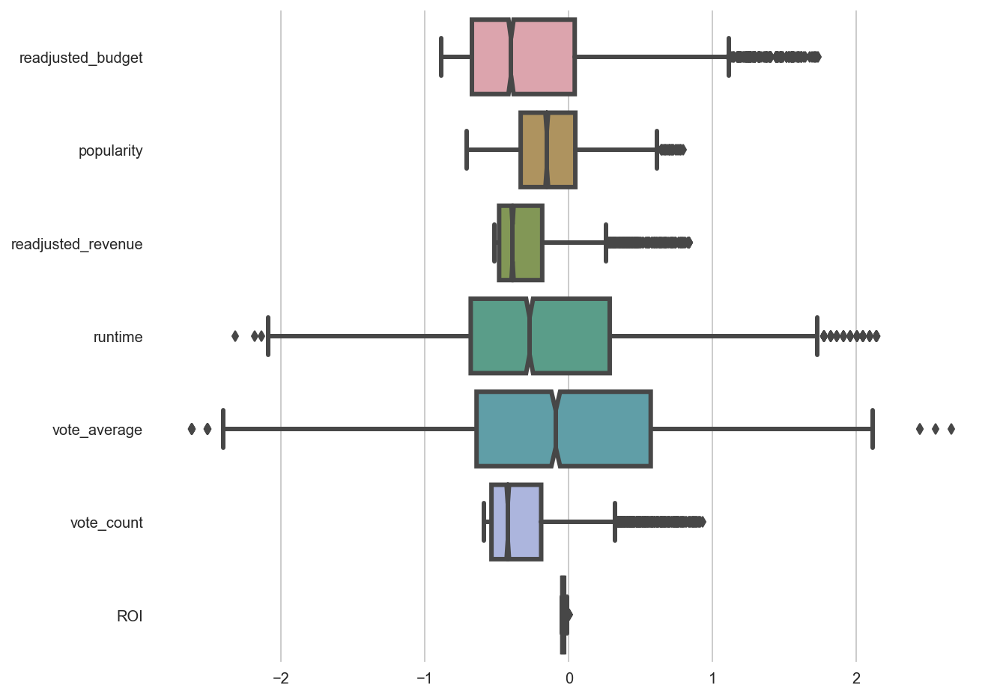

In [86]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.boxplot(data=df_out, orient='h', fliersize=5,
            linewidth=3, notch=True, saturation=0.5, ax=ax)
plt.show()

Time to split the data and create a list for categorical features for model fitting:

In [49]:
all_features = ['readjusted_budget', 'popularity', 'readjusted_revenue', 'runtime', 'vote_average', 'vote_count', 'ROI', 'adult', 'belongs_to_collection', 'genres', 'original_language', 'production_companies', 
                        'production_countries', 'spoken_languages', 'status', 'year_release', 'month_release', 
                        'day_release']

categorical_features = ['adult', 'belongs_to_collection', 'genres', 'original_language', 'production_companies', 
                        'production_countries', 'spoken_languages', 'status', 'year_release', 'month_release', 
                        'day_release']

I will also save the clean df for security:

In [88]:
df1 = df_clean.to_csv(r'/Users/ceciliaoliveira/Desktop/GA/archive (2)/df1.csv', index=False)

## 6. Data Model Building

To start model fitting, we need to create a dummified df:

In [106]:
df1_dum = pd.get_dummies(df_clean[all_features], columns=categorical_features, drop_first=True)
df1_dum.head()

readjusted_budget  popularity  readjusted_revenue  runtime  vote_average  \
0       5.032618e+07   21.946943        6.266516e+08     81.0           7.7   
1       1.090401e+08   17.015539        4.408527e+08    104.0           6.9   
3       2.684063e+07    3.859495        1.366392e+08    127.0           6.1   
5       1.006524e+08   17.924927        3.144326e+08    170.0           7.7   
8       5.871388e+07    5.231580        1.079499e+08    106.0           5.5   

   vote_count          ROI  belongs_to_collection_... Has Fallen Collection  \
0      5415.0  1145.180110                                                0   
1      2413.0   304.303460                                                0   
3        34.0   409.075975                                                0   
5      1886.0   212.394697                                                0   
8       174.0    83.857631                                                0   

   belongs_to_collection_101 Dalmatians (Animated) Collection  \
0                                                  0            
1                                                  0            
3                                                  0            
5                                                  0            
8                                                  0            

   belongs_to_collection_101 Dalmatians (Live-Action) Collection  \
0                                                  0               
1                                                  0               
3                                                  0               
5                                                  0               
8                                                  0               

   belongs_to_collection_12 Rounds Collection  \
0                                           0   
1                                           0   
3                                           0   
5                                           0   
8                                           0   

   belongs_to_collection_2 Days In... Collection  \
0                                              0   
1                                              0   
3                                              0   
5                                              0   
8                                              0   

   belongs_to_collection_20th Century Boys Collection  \
0                                                  0    
1                                                  0    
3                                                  0    
5                                                  0    
8                                                  0    

   belongs_to_collection_28 Days/Weeks Later Collection  \
0                                                  0      
1                                                  0      
3                                                  0      
5                                                  0      
8                                                  0      

   belongs_to_collection_30 Days of Night Collection  \
0                                                  0   
1                                                  0   
3                                                  0   
5                                                  0   
8                                                  0   

   belongs_to_collection_300 Collection  \
0                                     0   
1                                     0   
3                                     0   
5                                     0   
8                                     0   

   belongs_to_collection_48 Hrs. Collection  \
0                                         0   
1                                         0   
3                                         0   
5                                         0   
8                                         0   

   belongs_to_collection_8MM Collection  \
0                        

We will now start the predictive modeling with regression and classification prediction and evaluate the model's performances. 

### 6.1 Regression Models

#### 6.1.1 ROI

Firstly, I would like to take a look at the variable I created based on the Budget and Revenue. Time to start fitting models.

To start, let's split into train and test data in order to fit the models. 

In [51]:
X = df1_dum
y = df1_dum.pop('ROI')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [52]:
scaler = StandardScaler() 
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

In [53]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('Training score:', lr.score(X_train,y_train))
print('Test Score:', lr.score(X_test, y_test))
print('Cross validation:', lr.score(X_train, y_train))
print('Mean cross validation score:', cross_val_score(lr, X_train, y_train, cv=5, scoring='neg_mean_squared_error').mean())

Training score: -4.087070159930329
Test Score: -7.0878198583936e+29
Cross validation: -4.087070159930329
Mean cross validation score: -4.016815231854799e+44


In [54]:
model = RidgeCV(alphas=np.logspace(2, 8, 20), cv=5) 
model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))
print('Mean cross validation score:', cross_val_score(model, X_train, y_train, cv=3).mean())

Best alpha: 100000000.0
Training score: 1.438029071731961e-05
Test Score: -0.0019981460805615914
Mean cross validation score: -59.0241312780992


In [55]:
alpha = model.alpha_
model = Ridge(alpha=alpha) 
scores = cross_val_score(model, X_train, y_train, cv=5, n_jobs=2)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [-1.57325670e-03 -2.36910003e-04 -7.35049305e+01 -2.63843146e+05
 -3.57408776e-02]
Mean cross-validated training score: -52783.337741463954
Training Score: 1.438029071731961e-05
Test Score: -0.0019981460805615914


In [96]:
model = LassoCV(alphas=np.logspace(2, 8, 20), cv=5, max_iter=1000000)
model.fit(X_train, y_train)
scores = cross_val_score(model, X_train, y_train, cv=2, n_jobs=2)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [-0.00141869 -0.09811151]
Mean cross-validated training score: -0.04976509966572351
Training Score: 0.0
Test Score: -0.0312991155419986


In [97]:
alpha = model.alpha_
model = Lasso(alpha=alpha)

scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [-7.97303807e-02 -1.43304827e-03 -1.31668403e-05 -9.92485611e-04
 -1.25600154e-01]
Mean cross-validated training score: -0.04155384707624003
Training Score: 0.0
Test Score: -0.0312991155419986


In [120]:
model = ElasticNetCV(alphas=np.logspace(2, 4, 20), 
                     l1_ratio=np.linspace(0.01, 1.0, 25),
                     cv=5, max_iter=1000000)

model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Best l1-ratio:', model.l1_ratio_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Best alpha: 100.0
Best l1-ratio: 0.505
Training score: 0.01752873967777535
Test Score: -0.014828617926606169


In [100]:
#alpha = model.alpha_ 
l1_ratio = model.l1_ratio_
model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)

scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [-7.97303807e-02 -1.43304827e-03 -1.31668403e-05 -9.92485611e-04
 -1.25600154e-01]
Mean cross-validated training score: -0.04155384707624003
Training Score: 0.0
Test Score: -0.0312991155419986


In [56]:
reg = GradientBoostingRegressor(random_state=0, n_estimators=50, max_depth=2, tol=0.01) 
reg.fit(X_train, y_train)
GradientBoostingRegressor(random_state=0)
reg.predict(X_test[1:2])
scores = cross_val_score(reg, X_train, y_train, cv=5)
print("Train score:", reg.score(X_train, y_train))
print("Test score:", reg.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

Train score: 0.9892423752378896
Test score: 0.30540365868060926
Cross-validated training scores: -1621860.7267674769


In [66]:
nnet = MLPRegressor(solver='lbfgs', 
                    activation='identity', max_iter=10000000, 
                    alpha=10**(-12), 
                    random_state=1)
nnet.fit(X_train, y_train)
scores = cross_val_score(model, X_train, y_train, cv=5)
metrics.mean_squared_error(y_test, nnet.predict(X_test))
print("Train score:", nnet.score(X_train, y_train))
print("Test score:", nnet.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

Train score: 0.18533928119907395
Test score: -1.4782780517584033
Cross-validated training scores: -52783.337741463954


As we can see from the scores above, it is quite difficult to get good scores with the ROI and, as seen in a previous correlation plot, this variable is not very correlated to the other variables. It shows on the results. This means that the variables we have at the moment do not predict the  ROI well enough. One way of fixing it would be to gather further data. 

With such low scores, we wouldn't be confident in predicting future ROI with the historical data we have at present. We are here underfitting. The test set, with it's negative score, is showing that it does not have the same distribution as the training set. 

We can, however, see that with Gradient Boosting Regressor, we get a 0.98 train score and a performance of 0.30 in the test data. 

As this was a variable created by me, the data gathered for this objetive was unfortunaltely not enough to predict better results. 

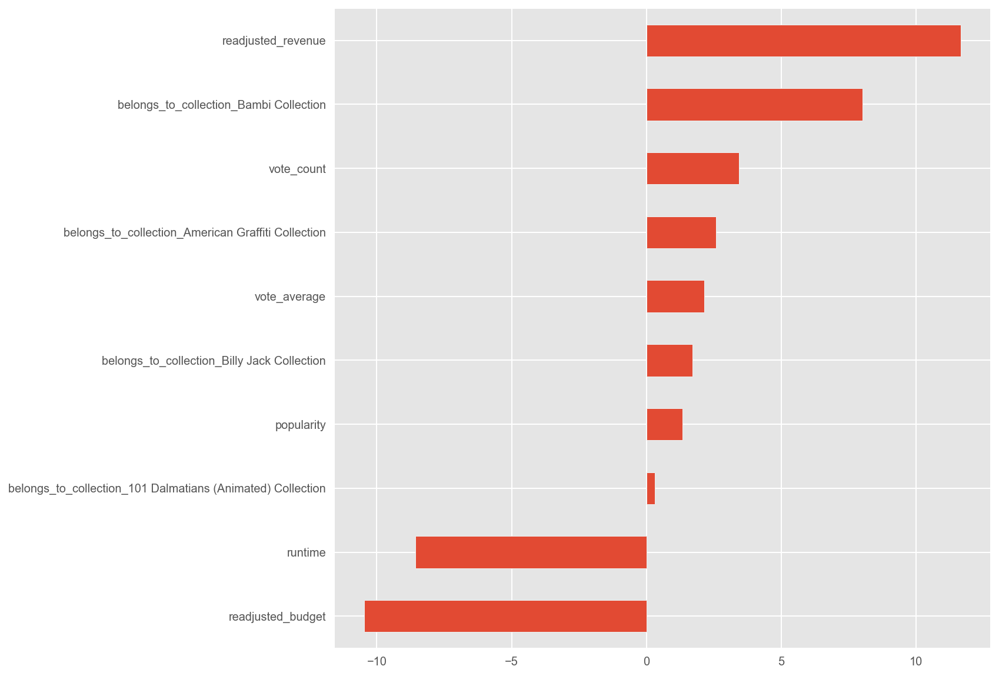

In [121]:
df_coef = pd.DataFrame(model.coef_, index=X_train.columns,
                       columns=['coefficients'])
df_coef = df_coef[df_coef.coefficients != 0].head(10)
df_coef['coef_abs'] = (df_coef.coefficients.abs())
df_coef

df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(10, 10));

Although ROI is not very correlated to the other variables, it is obviously positively correlated by the revenue, vote count and average vote (score). It is also positively correlated with "Bambi" collection and "Billy Jack". 

#### 6.1.2 Vote Average

As the results were quite poor above, I wanted to check what I could get with variables that were already in the dataset and I was not disappointed. Let's see the vote_average. 

In [68]:
X = df1_dum
y = df1_dum.pop('vote_average')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [124]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('Training score:', lr.score(X_train,y_train))
print('Test Score:', lr.score(X_test, y_test))
print('Cross validation:', lr.score(X_train, y_train))
print('Mean cross validation score:', cross_val_score(lr, X_train, y_train, cv=5).mean())

Training score: 0.6835918693119738
Test Score: 0.2198626737555729
Cross validation: 0.6835918693119738
Mean cross validation score: -1909818.9913824152


In [69]:
model = RidgeCV(alphas=(0.00000000000000000000000000000011, 0.9999999999999999999999998), cv=5)
model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))
print('Mean cross validation score:', cross_val_score(model, X_train, y_train, cv=2).mean())

/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.73042e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.72793e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.50087e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.52022e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/lin

Best alpha: 1.0
Training score: 0.6122706583211044
Test Score: 0.32864984712297896


/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matrix in solving dual problem. Using "
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:190: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn("Singular matr

Mean cross validation score: 0.09435695027226537


In [194]:
model = Ridge(alpha=alpha, max_iter=100000000000000000)
scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.15246998 0.13583558 0.14853018 0.14333556 0.1190935 ]
Mean cross-validated training score: 0.13985296224472707
Training Score: 0.14350018272114673
Test Score: 0.16300118716443346


In [195]:
model = LassoCV(alphas=np.logspace(-2, 2, 10), cv=5, max_iter=100000)
model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Best alpha: 0.01
Training score: 0.26069725903987784
Test Score: 0.2745621199542919


In [196]:
alpha = model.alpha_
model = Lasso(alpha=alpha)

scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.24844787 0.2618014  0.25749877 0.24615447 0.24451709]
Mean cross-validated training score: 0.2516839200307196
Training Score: 0.26069725903987784
Test Score: 0.2745621199542919


In [197]:
model = ElasticNetCV(alphas=np.logspace(-2, 2, 10), 
                     l1_ratio=np.linspace(0.01, 1.0, 25),
                     cv=5, max_iter=1000000)

model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Best l1-ratio:', model.l1_ratio_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Best alpha: 0.01
Best l1-ratio: 0.01
Training score: 0.38269385159249814
Test Score: 0.3442579380737796


In [198]:
alpha = model.alpha_ 
l1_ratio = model.l1_ratio_
model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)

scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.32524258 0.33119142 0.33398374 0.32320524 0.30417838]
Mean cross-validated training score: 0.3235602723472829
Training Score: 0.38269385159249814
Test Score: 0.3442579380737796


In [70]:
reg = GradientBoostingRegressor(random_state=0, n_estimators=50, max_depth=2, tol=0.01) 
reg.fit(X_train, y_train)
GradientBoostingRegressor(random_state=0)
reg.predict(X_test[1:2])
scores = cross_val_score(reg, X_train, y_train, cv=5)
print("Train score:", reg.score(X_train, y_train))
print("Test score:", reg.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

Train score: 0.4202123147261574
Test score: 0.27859372332943133
Cross-validated training scores: 0.3789389908656925


In [96]:
nnet = MLPRegressor(solver='adam', 
                    activation='logistic', max_iter=100000000000000000, 
                    alpha=10**(-60), n_iter_no_change=5,
                    random_state=1)
nnet.fit(X_train, y_train)
scores = cross_val_score(model, X_train, y_train, cv=5)
metrics.mean_squared_error(y_test, nnet.predict(X_test))
print("Train score:", nnet.score(X_train, y_train))
print("Test score:", nnet.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.38297e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.97507e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.97338e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.04753e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
/Users/ceciliaoliveira/opt/anaconda3/lib/python3.8/site-packages/sklearn/lin

Train score: 0.04803653501670768
Test score: 0.011352645747093826
Cross-validated training scores: 0.2756668179840152


Although the scores were better than when looking at ROI, they are still quite low. This shows us that we would only be able to accurately get 0.42 of the train results with GradientBoostingRegressor and 0.27 of the unseen data, underfitting again. 

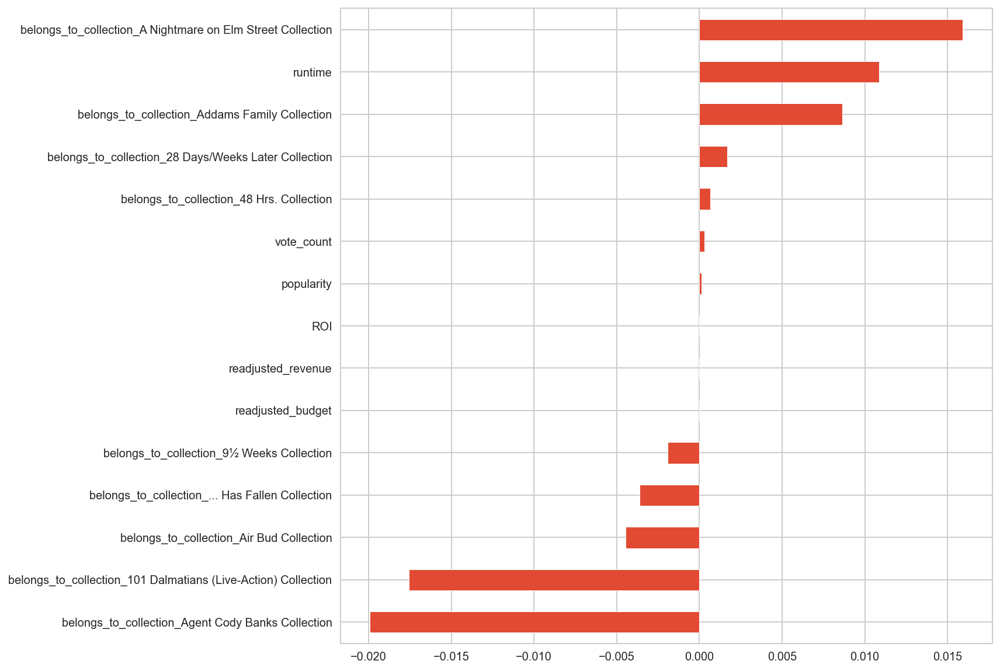

In [202]:
df_coef = pd.DataFrame(model.coef_, index=X_train.columns,
                       columns=['coefficients'])
df_coef = df_coef[df_coef.coefficients != 0].head(15)
df_coef['coef_abs'] = (df_coef.coefficients.abs())
df_coef

df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(10, 10));

We see here that vote average is positively correlated to the "A Nightmare on Elm Street" Collection, as well as the runtime and the "Adams Family" Collection. The "101 Dalmatians" (Live Action), however, is negatively correlated. 

#### 6.1.3. Revenue

As a last try I want to take a look at the revenue generated by the movie and here we definetely see some improvement. 

In [98]:
X = df1_dum
y = df1_dum.pop('readjusted_revenue')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [99]:
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

In [131]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('Training score:', lr.score(X_train,y_train))
print('Test Score:', lr.score(X_test, y_test))
print('Cross validation:', lr.score(X_train, y_train))
print('Mean cross validation score:', cross_val_score(lr, X_train, y_train, cv=5).mean())

Training score: -0.773959339980544
Test Score: -9.264976041173586e+27
Cross validation: -0.773959339980544
Mean cross validation score: -1.6920734783602163e+29


In [216]:
model = RidgeCV(alphas=np.logspace(-4, 4, 10), cv=5) 
model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))
print('Mean cross validation score:', cross_val_score(model, X_train, y_train, cv=2).mean())

Best alpha: 1291.5496650148827
Training score: 0.7089368128418865
Test Score: 0.5245446885460655
Mean cross validation score: 0.3307149427579315


In [217]:
alpha = model.alpha_
model = Ridge(alpha=alpha)
scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.14592322 0.46381713 0.44016199 0.26760767 0.45867471]
Mean cross-validated training score: 0.35523694250722837
Training Score: 0.7089368128418865
Test Score: 0.5245446885460655


In [219]:
model = LassoCV(alphas=np.logspace(-2, 2, 10), cv=5, max_iter=10000000) 
model.fit(X_train, y_train)
scores = cross_val_score(model, X_train, y_train, cv=5)
print('Best alpha:', model.alpha_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))
print("Mean cross-validated training score:", scores.mean())

Best alpha: 100.0
Training score: 0.7444730369544865
Test Score: 0.398797082263041
Mean cross-validated training score: -5.333962711532021


In [100]:
#alpha = model.alpha_
model = Lasso(alpha=alpha, max_iter=10000000)

scores = cross_val_score(model, X_train, y_train, cv=5) 
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.22931132 0.19643523 0.3516282  0.32141786 0.27506155]
Mean cross-validated training score: 0.2747708319919142
Training Score: 0.26540881583525056
Test Score: 0.1503467235179563


In [223]:
model = ElasticNetCV(alphas=np.logspace(-2, 2, 10), 
                     l1_ratio=np.linspace(0.01, 1.0, 25),
                     cv=5, max_iter=1000000)

model.fit(X_train, y_train)
print('Best alpha:', model.alpha_)
print('Best l1-ratio:', model.l1_ratio_)
print('Training score:', model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Best alpha: 1.6681005372000592
Best l1-ratio: 0.42250000000000004
Training score: 0.629891849799446
Test Score: 0.5198823271043033


In [135]:
#alpha = model.alpha_ 
#l1_ratio = model.l1_ratio_
model = ElasticNet()

scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train, y_train)
print("Training Score:", model.score(X_train, y_train))
print("Test Score:", model.score(X_test, y_test))

Cross-validated training scores: [0.20970322 0.46440309 0.45553391 0.27124901 0.47649659]
Mean cross-validated training score: 0.37547716531263825
Training Score: 0.6837027510033984
Test Score: 0.5311544886614126


In [101]:
reg = GradientBoostingRegressor(random_state=0, n_estimators=50, max_depth=2, tol=0.01) 
reg.fit(X_train, y_train)
GradientBoostingRegressor(random_state=0)
reg.predict(X_test[1:2])
scores = cross_val_score(reg, X_train, y_train, cv=5)
print("Train score:", reg.score(X_train, y_train))
print("Test score:", reg.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

Train score: 0.880953108659531
Test score: 0.5776328818431722
Cross-validated training scores: 0.7881078603264969


In [102]:
nnet = MLPRegressor(solver='lbfgs', 
                    activation='identity', max_iter=10000000, 
                    alpha=10**(-12), 
                    random_state=1)
nnet.fit(X_train, y_train)
scores = cross_val_score(model, X_train, y_train, cv=5)
metrics.mean_squared_error(y_test, nnet.predict(X_test))
print("Train score:", nnet.score(X_train, y_train))
print("Test score:", nnet.score(X_test, y_test))
print("Cross-validated training scores:", scores.mean())

Train score: 0.8141894105440619
Test score: 0.18816337359958524
Cross-validated training scores: 0.2747708319919142


We can see here that we are getting better results in revenue as with a Gradient Boosting Regressor, we get training scores of 0.88 on training and 0.57 on test data. 

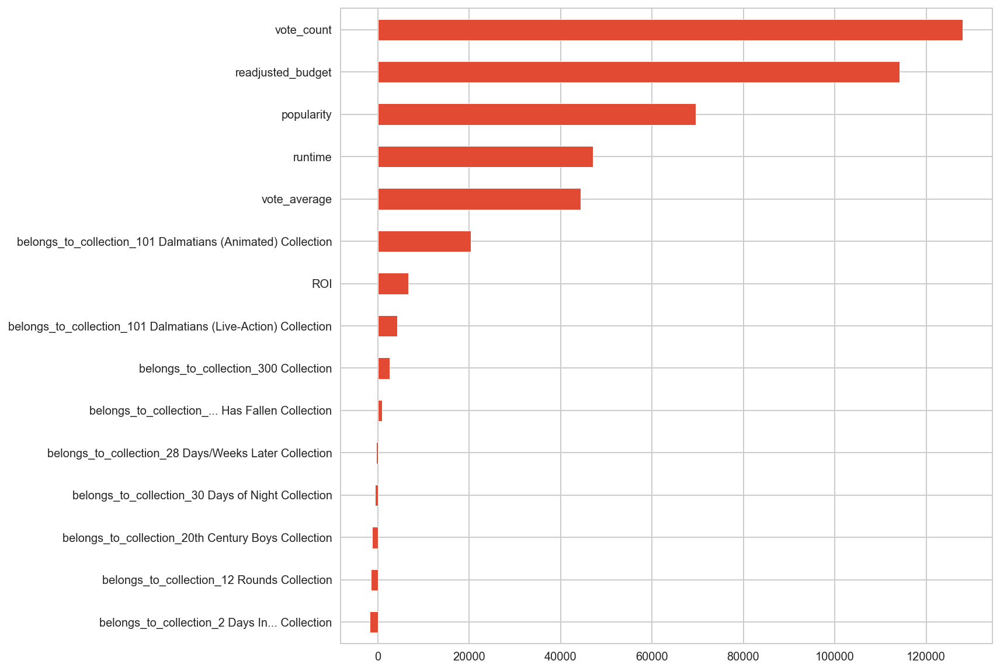

In [226]:
df_coef = pd.DataFrame(model.coef_, index=X_train.columns,
                       columns=['coefficients'])
df_coef = df_coef[df_coef.coefficients != 0].head(15)
df_coef['coef_abs'] = (df_coef.coefficients.abs())
df_coef

df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(10, 10));

Revenue here is positively correlated to the budget, popularity, vote average (score) and ROI, as well as the "101 Dalmatians" Animated Collection. 

## 6.2 Classification

As the ROI regression analysis was a bit of a miss, I wanted to understand if we could instead create a classification problem. Firstly, I will classify if the ROI exists or not (if the return on investment is more than 100% or not). I will also create a new column in our dummified dataframe. 

In [103]:
def return_on_in(ROI):
    if ROI > 100:
        return '1'
    else: 
        return '0'

In [109]:
df1_dum['valid_investment'] = df1_dum['ROI'].apply(lambda x: return_on_in(x))
df1_dum.head()

readjusted_budget  popularity  readjusted_revenue  runtime  vote_average  \
0       5.032618e+07   21.946943        6.266516e+08     81.0           7.7   
1       1.090401e+08   17.015539        4.408527e+08    104.0           6.9   
3       2.684063e+07    3.859495        1.366392e+08    127.0           6.1   
5       1.006524e+08   17.924927        3.144326e+08    170.0           7.7   
8       5.871388e+07    5.231580        1.079499e+08    106.0           5.5   

   vote_count          ROI  belongs_to_collection_... Has Fallen Collection  \
0      5415.0  1145.180110                                                0   
1      2413.0   304.303460                                                0   
3        34.0   409.075975                                                0   
5      1886.0   212.394697                                                0   
8       174.0    83.857631                                                0   

   belongs_to_collection_101 Dalmatians (Animated) Collection  \
0                                                  0            
1                                                  0            
3                                                  0            
5                                                  0            
8                                                  0            

   belongs_to_collection_101 Dalmatians (Live-Action) Collection  \
0                                                  0               
1                                                  0               
3                                                  0               
5                                                  0               
8                                                  0               

   belongs_to_collection_12 Rounds Collection  \
0                                           0   
1                                           0   
3                                           0   
5                                           0   
8                                           0   

   belongs_to_collection_2 Days In... Collection  \
0                                              0   
1                                              0   
3                                              0   
5                                              0   
8                                              0   

   belongs_to_collection_20th Century Boys Collection  \
0                                                  0    
1                                                  0    
3                                                  0    
5                                                  0    
8                                                  0    

   belongs_to_collection_28 Days/Weeks Later Collection  \
0                                                  0      
1                                                  0      
3                                                  0      
5                                                  0      
8                                                  0      

   belongs_to_collection_30 Days of Night Collection  \
0                                                  0   
1                                                  0   
3                                                  0   
5                                                  0   
8                                                  0   

   belongs_to_collection_300 Collection  \
0                                     0   
1                                     0   
3                                     0   
5                                     0   
8                                     0   

   belongs_to_collection_48 Hrs. Collection  \
0                                         0   
1                                         0   
3                                         0   
5                                         0   
8                                         0   

   belongs_to_collection_8MM Collection  \
0                        

In [110]:
print('baseline:', df1_dum['valid_investment'].value_counts(normalize=True))

baseline: 1    0.509673
0    0.490327
Name: valid_investment, dtype: float64


For reference, we see here that the baseline is 0.51. 

In [111]:
X = df1_dum
y = df1_dum.pop('valid_investment')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [112]:
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

In [117]:
params = {'C': np.logspace(-2, 2, 10), 
          'penalty': ['l1', 'l2'],
          'fit_intercept': [True, False]}

model = LogisticRegression(multi_class='ovr',  max_iter=100000)

In [118]:
gs = GridSearchCV(estimator=model,
                  param_grid=params, 
                  n_jobs=12,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)
gs.fit(X_train, y_train)
print('Best estimator:', gs.best_estimator_)
print('Best Score:', gs.best_score_)
print('Train score:', gs.score(X_train, y_train))
print('Test score:', gs.score(X_test, y_test))
print('Best Parameters:', gs.best_params_)

Best estimator: LogisticRegression(C=100.0, max_iter=100000, multi_class='ovr')
Best Score: 0.8951162790697674
Train score: 0.9988372093023256
Test score: 0.8949814126394052
Best Parameters: {'C': 100.0, 'fit_intercept': True, 'penalty': 'l2'}


In [120]:
params = {}
model = naive_bayes.GaussianNB()

In [121]:
gsg = GridSearchCV(estimator=model, 
                  param_grid=params,
                  n_jobs=12,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)
gsg.fit(X_train, y_train)
print('Best estimator:', gsg.best_estimator_)
print('Best Score:', gsg.best_score_)
print('Train score:', gsg.score(X_train, y_train))
print('Test score:', gsg.score(X_test, y_test))

Best estimator: GaussianNB()
Best Score: 0.5900000000000001
Train score: 0.7516279069767442
Test score: 0.5947955390334573


We can see from the Logistic Regression fitting on GridSearch results that we are overfitting as the training scores were 0.99 and the test was 0.89. When trying Naive_Bayes, the results were not as high.


Let's fit the confusion matrix for the train and test data and take a look at the recal, precision and F-scores to get further information. 

In [122]:
predictions_train = gs.predict(X_train)
predictions_test = gs.predict(X_test)

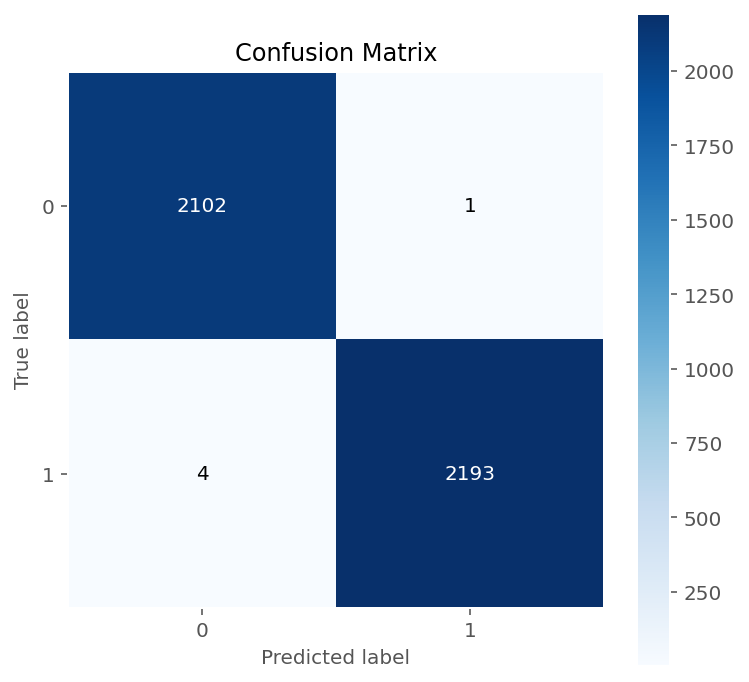

In [123]:
skplt.metrics.plot_confusion_matrix(y_train, predictions_train, figsize=(6,6))
plt.show()

In [124]:
print(classification_report(y_train, predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2103
           1       1.00      1.00      1.00      2197

    accuracy                           1.00      4300
   macro avg       1.00      1.00      1.00      4300
weighted avg       1.00      1.00      1.00      4300



For the train data, we see the higher scores in True Positives (2102) and True Negatives (2193), giving us confidence in the model. 

Recall score gives us the accuracy among only actual positives, high here with 1.0 all around. 

Precision shows that there is a low incidence of false negatives and false positives, giving us an accuracy of 1.00 for both for valid investments. 

The F1-score shows us the balance between Precision and Recall score, giving us still 1.00 scores. 

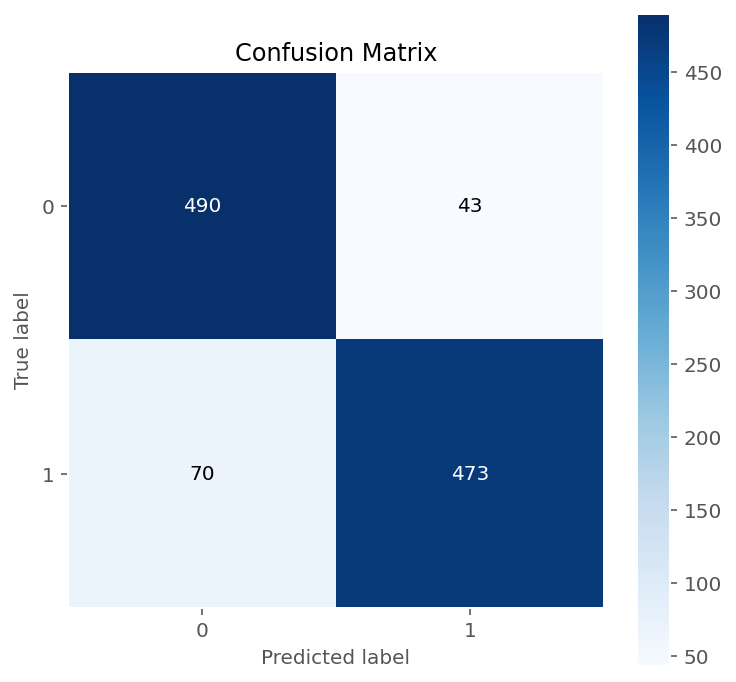

In [125]:
skplt.metrics.plot_confusion_matrix(y_test, predictions_test, figsize=(6, 6))
plt.show()

In [126]:
print(classification_report(y_test, predictions_test))

              precision    recall  f1-score   support

           0       0.88      0.92      0.90       533
           1       0.92      0.87      0.89       543

    accuracy                           0.89      1076
   macro avg       0.90      0.90      0.89      1076
weighted avg       0.90      0.89      0.89      1076



Now in regards to the test data, we do not get such high scores as for the test but we are still looking at interesting results. The True Positives are much higher than the False Positives, comforting us in our  predictions. The True Negatives are still the higher number (490). Althought the number of predicted successes which were not (43) are not very high, it would be best to decrease this number to the maximum in future. 

Recall is showing that only 0.92 of times we have accuracy with the actual not good investments and 0.87 for good film investments. 

Precision is showing a low incidence of false positives and false negatives. 

In [127]:
def plot_f1_lines(figsize=(8, 6), fontsize=16):

    fig, ax = plt.subplots(figsize=figsize)

    for const in np.linspace(0.2, 0.9, 8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                    xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

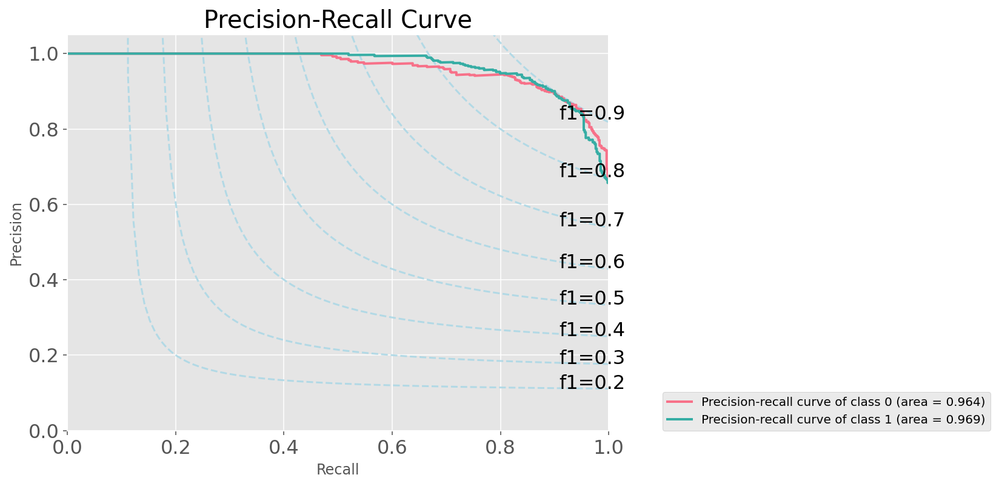

In [128]:
cmap = ListedColormap(sns.color_palette("husl", len(gs.classes_)))
fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, gs.predict_proba(X_test),
                                    plot_micro=False,
                                    title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1, 0])
plt.show()

The Precision Recall Curve shows us the precision/recall for each threshold for the fitted model. 

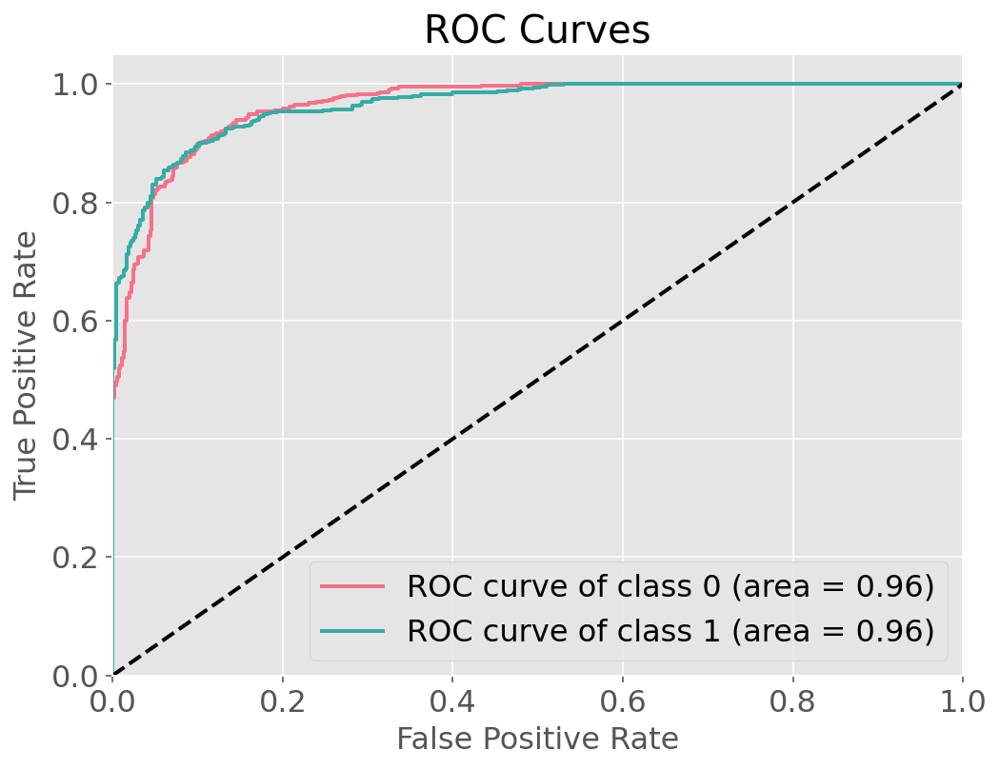

In [129]:
skplt.metrics.plot_roc(y_test, gs.predict_proba(X_test), plot_micro=False, plot_macro=False,
                       title_fontsize=20, text_fontsize=16, figsize=(8, 6), cmap=cmap)
plt.show()

ROC curves connect the dots between false positives and true positives for different threshold values. Here, we see that with a threshold of 0.96, the models look good. 

.

There has been a player in the movie production market that has made quite a change in the landscape. Although Netflix started in 1997, it changed it's model in 2011 by charging different prices for mail rental and streaming services and therefore the market.

In [130]:
all_features = ['readjusted_budget', 'readjusted_revenue', 'runtime', 'vote_average', 'vote_count', 'ROI', 'genres', 'production_companies', 
                        'production_countries', 'year_release', 'month_release', 'day_release']

categorical_features = ['genres', 'production_companies', 'production_countries', 'month_release', 'day_release']

In [131]:
df_dum = pd.get_dummies(df_clean[all_features], columns=categorical_features, drop_first=True)
df_dum.head()

readjusted_budget  readjusted_revenue  runtime  vote_average  vote_count  \
0       5.032618e+07        6.266516e+08     81.0           7.7      5415.0   
1       1.090401e+08        4.408527e+08    104.0           6.9      2413.0   
3       2.684063e+07        1.366392e+08    127.0           6.1        34.0   
5       1.006524e+08        3.144326e+08    170.0           7.7      1886.0   
8       5.871388e+07        1.079499e+08    106.0           5.5       174.0   

           ROI  year_release  genres_Adventure  genres_Animation  \
0  1145.180110          1995                 0                 1   
1   304.303460          1995                 1                 0   
3   409.075975          1995                 0                 0   
5   212.394697          1995                 0                 0   
8    83.857631          1995                 0                 0   

   genres_Comedy  genres_Crime  genres_Documentary  genres_Drama  \
0              0             0                   0             0   
1              0             0                   0             0   
3              1             0                   0             0   
5              0             0                   0             0   
8              0             0                   0             0   

   genres_Family  genres_Fantasy  genres_Foreign  genres_History  \
0              0               0               0               0   
1              0               0               0               0   
3              0               0               0               0   
5              0               0               0               0   
8              0               0               0               0   

   genres_Horror  genres_Music  genres_Mystery  genres_None  genres_Romance  \
0              0             0               0            0               0   
1              0             0               0            0               0   
3              0             0               0            0               0   
5              0             0               0            0               0   
8              0             0               0            0               0   

   genres_Science Fiction  genres_TV Movie  genres_Thriller  genres_War  \
0                       0                0                0           0   
1                       0                0                0           0   
3                       0                0                0           0   
5                       0                0                0           0   
8                       0                0                0           0   

   genres_Western  production_companies_ Acres   \
0               0                             0   
1               0                             0   
3               0                             0   
5               0                             0   
8               0                             0   

   production_companies_ Arts Entertainment  production_companies_ Bares  \
0                                         0                            0   
1                                         0                            0   
3                                         0                            0   
5                                         0                            0   
8                                         0                            0   

   production_companies_ Century Film Corporation  \
0                                               0   
1                                               0   
3                                               0   
5                                               0   
8                                               0   

   production_companies_ Century Fox  production_companies_ Entertainment  \
0                                  0                                    0   
1                                  0                                    0   
3                                  0                         

In [132]:
df_dum['valid_investment'] = df_dum['ROI'].apply(lambda x: return_on_in(x))

In [133]:
X_train_n = df_dum[df_dum.year_release < 2011].copy()
y_train_n = X_train_n.pop('valid_investment')
X_test_n = df_dum[df_dum.year_release >= 2011].copy()
y_test_n = X_test_n.pop('valid_investment')

In [134]:
scaler = StandardScaler()
X_train_n = pd.DataFrame(scaler.fit_transform(X_train_n), columns=X_train_n.columns) 
X_test_n = pd.DataFrame(scaler.transform(X_test_n), columns=X_test_n.columns)

In [93]:
model = LogisticRegression(max_iter=100000)
model.fit(X_train_n, y_train_n)
print('Training score:', model.score(X_train_n,y_train_n))
print('Test Score:', model.score(X_test_n, y_test_n))
print('Cross validation:', model.score(X_train_n, y_train_n))
print('Mean cross validation score:', cross_val_score(model, X_train_n, y_train_n, cv=5).mean())

Training score: 0.9785166240409208
Test Score: 0.8323699421965318
Cross validation: 0.9785166240409208
Mean cross validation score: 0.8772378516624041


In [137]:
params = {'C': np.logspace(-2, 2, 10), 
          'penalty': ['l1', 'l2'],
          'fit_intercept': [True, False]}

model = LogisticRegression(multi_class='ovr',  max_iter=10000)

In [138]:
gs = GridSearchCV(estimator=model,
                  param_grid=params, 
                  n_jobs=12,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)
gs.fit(X_train_n, y_train_n)
print('Best estimator:', gs.best_estimator_)
print('Best Score:', gs.best_score_)
print('Train score:', gs.score(X_train_n, y_train_n))
print('Test score:', gs.score(X_test_n, y_test_n))
print('Best Parameters:', gs.best_params_)

Best estimator: LogisticRegression(C=100.0, max_iter=10000, multi_class='ovr')
Best Score: 0.9314861460957179
Train score: 0.9954659949622167
Test score: 0.9061166429587483
Best Parameters: {'C': 100.0, 'fit_intercept': True, 'penalty': 'l2'}


In [106]:
params = {} 
model = naive_bayes.GaussianNB()

In [108]:
gsg = GridSearchCV(estimator=model,
                  param_grid=params,
                  n_jobs=12,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)
gsg.fit(X_train_n, y_train_n)
print('Best estimator:', gsg.best_estimator_)
print('Best Score:', gsg.best_score_)
print('Train score:', gsg.score(X_train_n, y_train_n))
print('Test score:', gsg.score(X_test_n, y_test_n))
print('Best Parameters:', gsg.best_params_)

Best estimator: GaussianNB()
Best Score: 0.5332480818414322
Train score: 0.6565217391304348
Test score: 0.5447976878612717
Best Parameters: {}


Comparatively to the other models with a random train and test fit, we continue to see high scores, leading me to believe that the variables pre-2011 are also very good predictors for movies that have been made after. 

It is now time to take a look at the confusion matrix, classificiation scores and curves. 

In [139]:
predictions_train = gs.predict(X_train_n)
predictions_test = gs.predict(X_test_n)

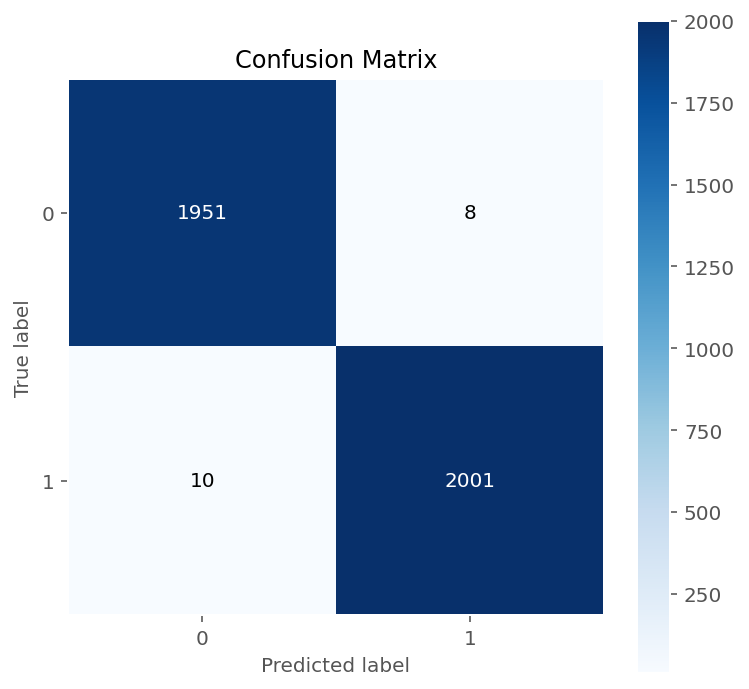

In [140]:
skplt.metrics.plot_confusion_matrix(y_train_n, predictions_train, figsize=(6,6))
plt.show()

In [141]:
print(classification_report(y_train_n, predictions_train))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1959
           1       1.00      1.00      1.00      2011

    accuracy                           1.00      3970
   macro avg       1.00      1.00      1.00      3970
weighted avg       1.00      1.00      1.00      3970



In the training scores, we see really small numbers for False Negatives (10) and False Positives (8). 

The Recall scores of 1.00 gives us high accuracy among only actual positives. 

Precision shows that there is a low incidence of false negatives and false positives, giving us an accuracy of 1.00 and 1.00 for valid investments or not. 

The F1-score shows us a very high average between Precision and Recall score. 

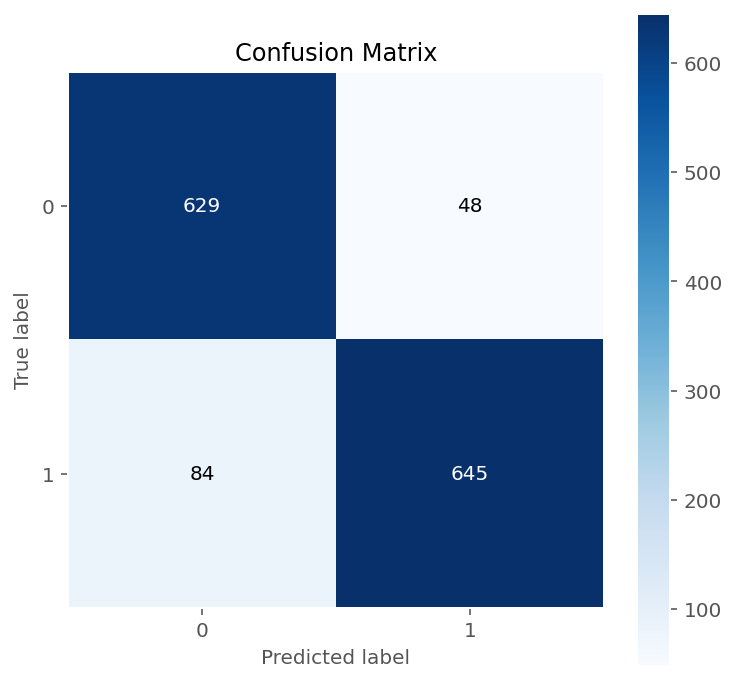

In [142]:
skplt.metrics.plot_confusion_matrix(y_test_n, predictions_test, figsize=(6, 6))
plt.show()

In [143]:
print(classification_report(y_test_n, predictions_test))

              precision    recall  f1-score   support

           0       0.88      0.93      0.91       677
           1       0.93      0.88      0.91       729

    accuracy                           0.91      1406
   macro avg       0.91      0.91      0.91      1406
weighted avg       0.91      0.91      0.91      1406



Once again as similarly as to the former model fitting, we see a higher incidence of False Negatives (84) and False Positives (48) comparatively and proportionally to the True Positive and True Negative results. Although the results are slightly lower, Precision, Recall and F1-scores are still high. 

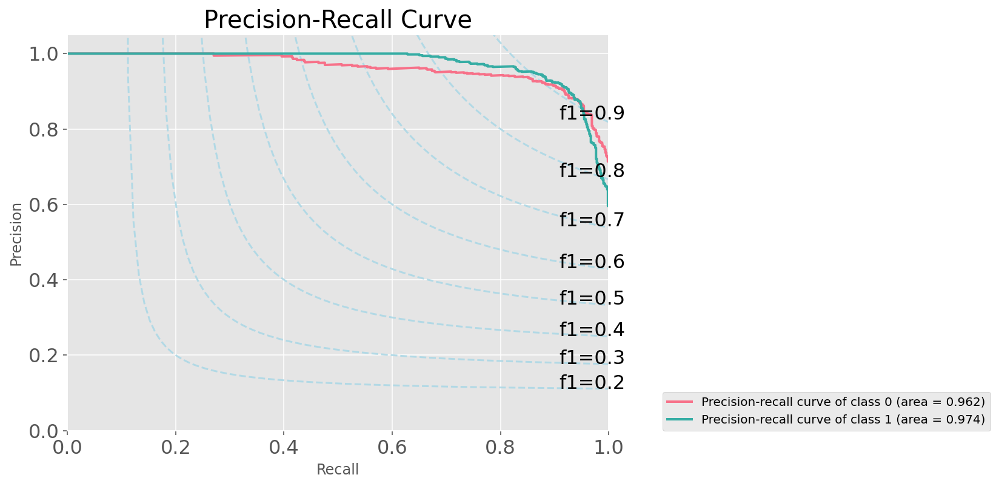

In [144]:
cmap = ListedColormap(sns.color_palette("husl", len(gs.classes_)))
fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test_n, gs.predict_proba(X_test_n),
                                    plot_micro=False,
                                    title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1, 0])
plt.show()

The Precision Recall Curve shows us the precision/recall scores which are obviously much higher, getting to 0.85 for not valid return on investment and .97 for return on investment. 

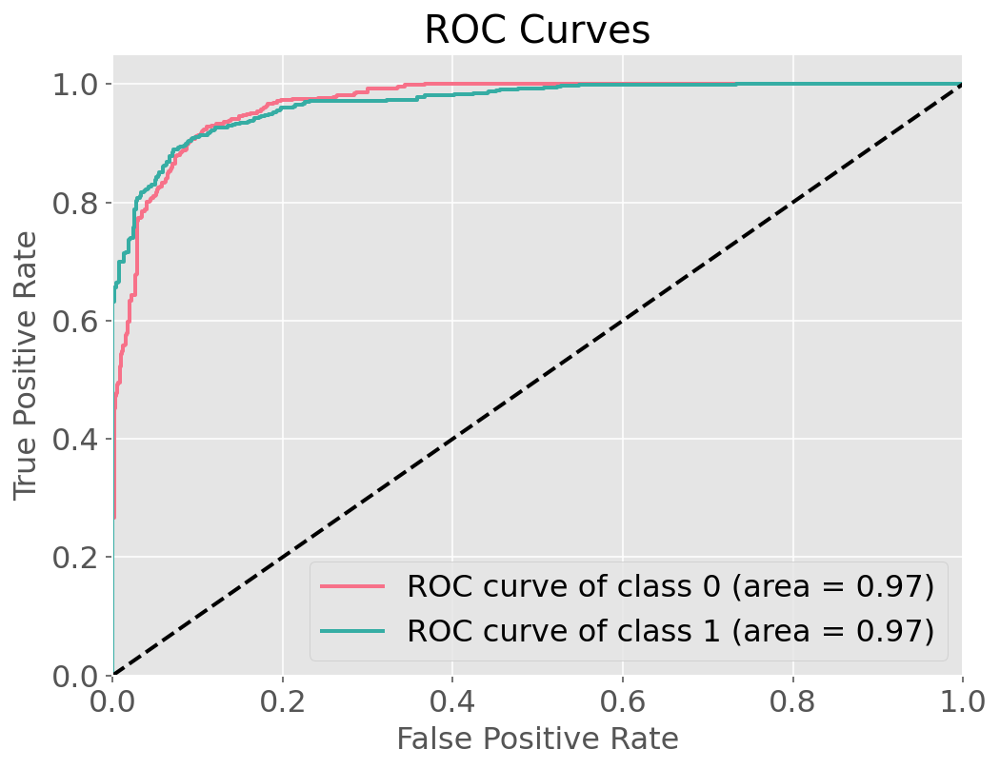

In [117]:
skplt.metrics.plot_roc(y_test_n, gs.predict_proba(X_test_n), plot_micro=False, plot_macro=False,
                       title_fontsize=20, text_fontsize=16, figsize=(8, 6), cmap=cmap)
plt.show()

ROC curves connects the dots between false positives and true positives for different threshold values. Here, we see that with a threshold of 0.97 for both valid or not investments, the models look great. 

## 6.3. NLP

As the data has a column of taglines, I wanted to take a look at the Natural Language Processing.  

In [137]:
df_clean['valid_investment'] = df_clean['ROI'].apply(lambda x: return_on_in(x))
df_clean.head()

,adult,belongs_to_collection,budget,genres,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,year_release,month_release,day_release,readjusted_revenue,readjusted_budget,ROI,valid_investment
0,False,Toy Story Collection,30000000,Animation,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,United States of America,1995-10-30,373554033.0,81.0,en,Released,Not Available,Toy Story,7.7,5415.0,1995,10,30,6.266516e+08,5.032618e+07,1145.180110,1
1,False,NoCollection,65000000,Adventure,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,TriStar Pictures,United States of America,1995-12-15,262797249.0,104.0,en,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,2413.0,1995,12,15,4.408527e+08,1.090401e+08,304.303460,1
3,False,NoCollection,16000000,Comedy,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,Twentieth Century Fox Film Corporation,United States of America,1995-12-22,81452156.0,127.0,en,Released,Friends are the people who let you be yourself...,Waiting to Exhale,6.1,34.0,1995,12,22,1.366392e+08,2.684063e+07,409.075975,1
5,False,NoCollection,60000000,Action,en,Heat,"Obsessive master thief, Neil McCauley leads a ...",17.924927,Regency Enterprises,United States of America,1995-12-15,187436818.0,170.0,en,Released,A Los Angeles Crime Saga,Heat,7.7,1886.0,1995,12,15,3.144326e+08,1.006524e+08,212.394697,1
8,False,NoCollection,35000000,Action,en,Sudden Death,International action superstar Jean Claude Van...,5.231580,Universal Pictures,United States of America,1995-12-22,64350171.0,106.0,en,Released,Terror goes into overtime.,Sudden Death,5.5,174.0,1995,12,22,1.079499e+08,5.871388e+07,83.857631,0


Firstly, I needed to create a new dataframe with the features which would assist in this modeling at the end of this analysis and ignore all the tagline that are "Not available" are irrelevant in this case. 

In [138]:
df_nlp = df_clean[['adult', 'belongs_to_collection', 'readjusted_budget', 'readjusted_revenue', 'genres', 'original_language', 'popularity', 'production_companies', 
                   'production_countries', 'runtime', 'spoken_languages', 'status', 'tagline', 'vote_average', 'vote_count', 'year_release', 
                   'month_release', 'day_release', 'valid_investment']]
df_nlp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5294 entries, 0 to 45422
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  5294 non-null   object 
 1   belongs_to_collection  5294 non-null   object 
 2   readjusted_budget      5294 non-null   float64
 3   readjusted_revenue     5294 non-null   float64
 4   genres                 5294 non-null   object 
 5   original_language      5294 non-null   object 
 6   popularity             5294 non-null   float64
 7   production_companies   5294 non-null   object 
 8   production_countries   5294 non-null   object 
 9   runtime                5294 non-null   float64
 10  spoken_languages       5294 non-null   object 
 11  status                 5294 non-null   object 
 12  tagline                5294 non-null   object 
 13  vote_average           5294 non-null   float64
 14  vote_count             5294 non-null   float64
 15  yea

In [139]:
df_nlp = df_nlp[df_nlp.tagline != 'Not Available']
df_nlp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4574 entries, 1 to 45167
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  4574 non-null   object 
 1   belongs_to_collection  4574 non-null   object 
 2   readjusted_budget      4574 non-null   float64
 3   readjusted_revenue     4574 non-null   float64
 4   genres                 4574 non-null   object 
 5   original_language      4574 non-null   object 
 6   popularity             4574 non-null   float64
 7   production_companies   4574 non-null   object 
 8   production_countries   4574 non-null   object 
 9   runtime                4574 non-null   float64
 10  spoken_languages       4574 non-null   object 
 11  status                 4574 non-null   object 
 12  tagline                4574 non-null   object 
 13  vote_average           4574 non-null   float64
 14  vote_count             4574 non-null   float64
 15  yea

As per usual, we will need to get a dummified dataframe to fit a classification model later. 

In [140]:
df_nlp_dum = pd.get_dummies(df_nlp, columns=['adult', 'belongs_to_collection', 'genres', 'original_language', 'production_companies', 
                   'production_countries', 'spoken_languages', 'status', 'year_release',  'month_release', 'day_release'], drop_first=True)
df_nlp_dum.head(2)


,readjusted_budget,readjusted_revenue,popularity,runtime,tagline,vote_average,vote_count,valid_investment,belongs_to_collection_... Has Fallen Collection,belongs_to_collection_101 Dalmatians (Animated) Collection,belongs_to_collection_101 Dalmatians (Live-Action) Collection,belongs_to_collection_12 Rounds Collection,belongs_to_collection_28 Days/Weeks Later Collection,belongs_to_collection_30 Days of Night Collection,belongs_to_collection_300 Collection,belongs_to_collection_48 Hrs. Collection,belongs_to_collection_8MM Collection,belongs_to_collection_9½ Weeks Collection,belongs_to_collection_A Haunted House Collection,belongs_to_collection_A Nightmare on Elm Street Collection,belongs_to_collection_AVP Collection,belongs_to_collection_Aashiqui Collection,belongs_to_collection_Ace Ventura Collection,belongs_to_collection_Addams Family Collection,belongs_to_collection_Agent Cody Banks Collection,belongs_to_collection_Air Bud Collection,belongs_to_collection_Airplane Collection,belongs_to_collection_Airport Collection,belongs_to_collection_Aladdin Collection,belongs_to_collection_Alex Cross Collection,belongs_to_collection_Alice in Wonderland Collection,belongs_to_collection_Alien Collection,belongs_to_collection_Alien Nation Collection,belongs_to_collection_All Dogs Go to Heaven Collection,belongs_to_collection_Allan Quatermain Collection,belongs_to_collection_Almighty Collection,belongs_to_collection_Alone in the Dark Collection,belongs_to_collection_Alpha and Omega Collection,belongs_to_collection_Alvin and the Chipmunks Collection,belongs_to_collection_American Graffiti Collection,belongs_to_collection_American Pie Collection,belongs_to_collection_American Psycho Collection,belongs_to_collection_Anaconda Collection,belongs_to_collection_Analyze Collection,belongs_to_collection_Anchorman Collection,belongs_to_collection_Anglo-Zulu War Collection,belongs_to_collection_Annabelle Collection,belongs_to_collection_Annie Collection,belongs_to_collection_Ant-Man Collection,belongs_to_collection_Appleseed Collection,belongs_to_collection_Arthur Collection,belongs_to_collection_Arthur and the Invisibles Collection,belongs_to_collection_Atlantis Collection,belongs_to_collection_Atlas Shrugged Collection,belongs_to_collection_Austin Powers Collection,belongs_to_collection_Avatar Collection,belongs_to_collection_Babe Collection,belongs_to_collection_Bachelor Party Collection,belongs_to_collection_Back to the Future Collection,belongs_to_collection_Bad Boys Collection,belongs_to_collection_Bad Santa Collection,belongs_to_collection_Bambi Collection,belongs_to_collection_Barbershop Collection,belongs_to_collection_Basic Instinct Collection,belongs_to_collection_Batman (DC Universe Animated) Collection,belongs_to_collection_Batman Collection,belongs_to_collection_Battle Royale Collection,belongs_to_collection_Beauty and the Beast Collection,belongs_to_collection_Beethoven Collection,belongs_to_collection_Before... Collection,belongs_to_collection_Behind Enemy Lines Collection,belongs_to_collection_Best Exotic Marigold Hotel Collection,belongs_to_collection_Beverly Hills Chihuahua Collection,belongs_to_collection_Beverly Hills Cop Collection,belongs_to_collection_Billy Jack Collection,belongs_to_collection_Blade Collection,belongs_to_collection_Blade Runner Collection,belongs_to_collection_Blair Witch Collection,belongs_to_collection_BloodRayne Collection,belongs_to_collection_Bloodsport Collection,belongs_to_collection_Blue Crush Collection,belongs_to_collection_Bon Cop Bad Cop Collection,belongs_to_collection_Bridget Jones Collection,belongs_to_collection_Bring It On Collection,belongs_to_collection_Brooklyn Cigar Store Collection,belongs_to_collection_Burnt by the Sun Trilogy,belongs_to_collection_C.H.U.D. Collection,belongs_to_collection_Caddyshack Collection,belongs_to_collection_Candyman Collection,belongs_to_collection_Cannonball Run Collection,belongs_to_collection_Captain America Collection,belongs_to_collection_Carnosaur Collection,

And split our data to start fitting models. 

In [141]:
y = df_nlp_dum.pop('valid_investment')
X = df_nlp_dum

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=1)

In [142]:
tagline_train = X_train.pop('tagline')
tagline_test = X_test.pop('tagline')

In [143]:
X.head()

readjusted_budget  readjusted_revenue  popularity  runtime  \
1       1.090401e+08        4.408527e+08   17.015539    104.0   
3       2.684063e+07        1.366392e+08    3.859495    127.0   
5       1.006524e+08        3.144326e+08   17.924927    170.0   
8       5.871388e+07        1.079499e+08    5.231580    106.0   
9       9.729728e+07        5.908194e+08   14.686036    130.0   

                                             tagline  vote_average  \
1          Roll the dice and unleash the excitement!           6.9   
3  Friends are the people who let you be yourself...           6.1   
5                           A Los Angeles Crime Saga           7.7   
8                         Terror goes into overtime.           5.5   
9               No limits. No fears. No substitutes.           6.6   

   vote_count  belongs_to_collection_... Has Fallen Collection  \
1      2413.0                                                0   
3        34.0                                                0   
5      1886.0                                                0   
8       174.0                                                0   
9      1194.0                                                0   

   belongs_to_collection_101 Dalmatians (Animated) Collection  \
1                                                  0            
3                                                  0            
5                                                  0            
8                                                  0            
9                                                  0            

   belongs_to_collection_101 Dalmatians (Live-Action) Collection  \
1                                                  0               
3                                                  0               
5                                                  0               
8                                                  0               
9                                                  0               

   belongs_to_collection_12 Rounds Collection  \
1                                           0   
3                                           0   
5                                           0   
8                                           0   
9                                           0   

   belongs_to_collection_28 Days/Weeks Later Collection  \
1                                                  0      
3                                                  0      
5                                                  0      
8                                                  0      
9                                                  0      

   belongs_to_collection_30 Days of Night Collection  \
1                                                  0   
3                                                  0   
5                                                  0   
8                                                  0   
9                                                  0   

   belongs_to_collection_300 Collection  \
1                                     0   
3                                     0   
5                                     0   
8                                     0   
9                                     0   

   belongs_to_collection_48 Hrs. Collection  \
1                                         0   
3                                         0   
5                                         0   
8                                         0   
9                                         0   

   belongs_to_collection_8MM Collection  \
1                                     0   
3                                     0   
5                                     0   
8                                     0   
9                                     0   

   belongs_to_collection_9½ Weeks Collection  \
1                                          0   
3                                          0   
5                                          0   
8             

In [144]:
tagline_train

7110      If you believe in yourself, anything can happen.
9460                       The truth needs no translation.
24372                                    Love Thy Neighbor
5189                                  Evil has an upgrade.
9352                    Some Rules Should Never Be Broken.
                               ...                        
5086                          Lights. Camera. Aggravation.
2761                   Your senses will never be the same.
190      Beyond your wildest dreams. Beyond your wildes...
906      WANTED by the police in all the luxury-spots o...
3121                            Talent Isn't Everything...
Name: tagline, Length: 3659, dtype: object

In [145]:
cvec = CountVectorizer(token_pattern='\w+', stop_words='english')
cvec_train = cvec.fit_transform(tagline_train)
cvec_test = cvec.transform(tagline_test)

In [146]:
X_train.shape

(3659, 1974)

In [147]:
X_train_sparse= scipy.sparse.csr_matrix(X_train.values)

In [148]:
X_test_sparse= scipy.sparse.csr_matrix(X_test.values)

In [149]:
X_train_final= scipy.sparse.hstack([X_train_sparse,cvec_train])

In [150]:
X_test_final= scipy.sparse.hstack([X_test_sparse,cvec_test])

In [152]:
y.value_counts(normalize=True)

1    0.530171
0    0.469829
Name: valid_investment, dtype: float64

In [156]:
model = LogisticRegression(max_iter=10000)
parameters= {'C': np.logspace(-4,4,10), 'penalty':['l1', 'l2']}
grid  = GridSearchCV(estimator = model,
                    param_grid = parameters, cv=3, n_jobs=2)

grid.fit(X_train, y_train)
print('Training score:', grid.score(X_train,y_train))
print('Test Score:', grid.score(X_test, y_test))
print('Cross validation:', grid.best_score_)

Training score: 1.0
Test Score: 1.0
Cross validation: 0.9994535519125683


In [157]:
grid.best_params_

{'C': 0.0001, 'penalty': 'l2'}

In [159]:
model = naive_bayes.GaussianNB()
params = {} 
gsg = GridSearchCV(estimator=model,
                  param_grid=params,
                  n_jobs=12,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True)
gsg.fit(X_train, y_train)
print('Best estimator:', gsg.best_estimator_)
print('Best Score:', gsg.best_score_)
print('Train score:', gsg.score(X_train, y_train))
print('Test score:', gsg.score(X_test, y_test))
print('Best Parameters:', gsg.best_params_)

Best estimator: GaussianNB()
Best Score: 0.6717697143668753
Train score: 0.6728614375512435
Test score: 0.6688524590163935
Best Parameters: {}


With the fitting Logistic Regression on GridSearch, we see scores just on the baseline. It would be interesting to take a look at the most popular words in the taglines.

In [160]:
cvec_mat = cvec.transform(df_nlp.tagline)
cvec_mat

<4574x3908 sparse matrix of type '<class 'numpy.int64'>'
	with 17337 stored elements in Compressed Sparse Row format>

In [161]:
words = cvec.get_feature_names()
print(len(words))

3908


In [162]:
a = cvec_mat.sum(axis=0)
df_word = pd.DataFrame(a, columns=words).transpose().sort_values(by=0, ascending=False)
df_word.head()

,0
s,683
t,308
love,243
life,198
man,190


In [163]:
df_word = df_word[2:]
df_word.head()

,0
love,243
life,198
man,190
story,189
world,178


Most common words in taglines are:

In [164]:
df_word = df_word.rename_axis('word').reset_index()
df_word.head()

,word,0
0,love,243
1,life,198
2,man,190
3,story,189
4,world,178


In [165]:
text = df_word['word'].head(100).values

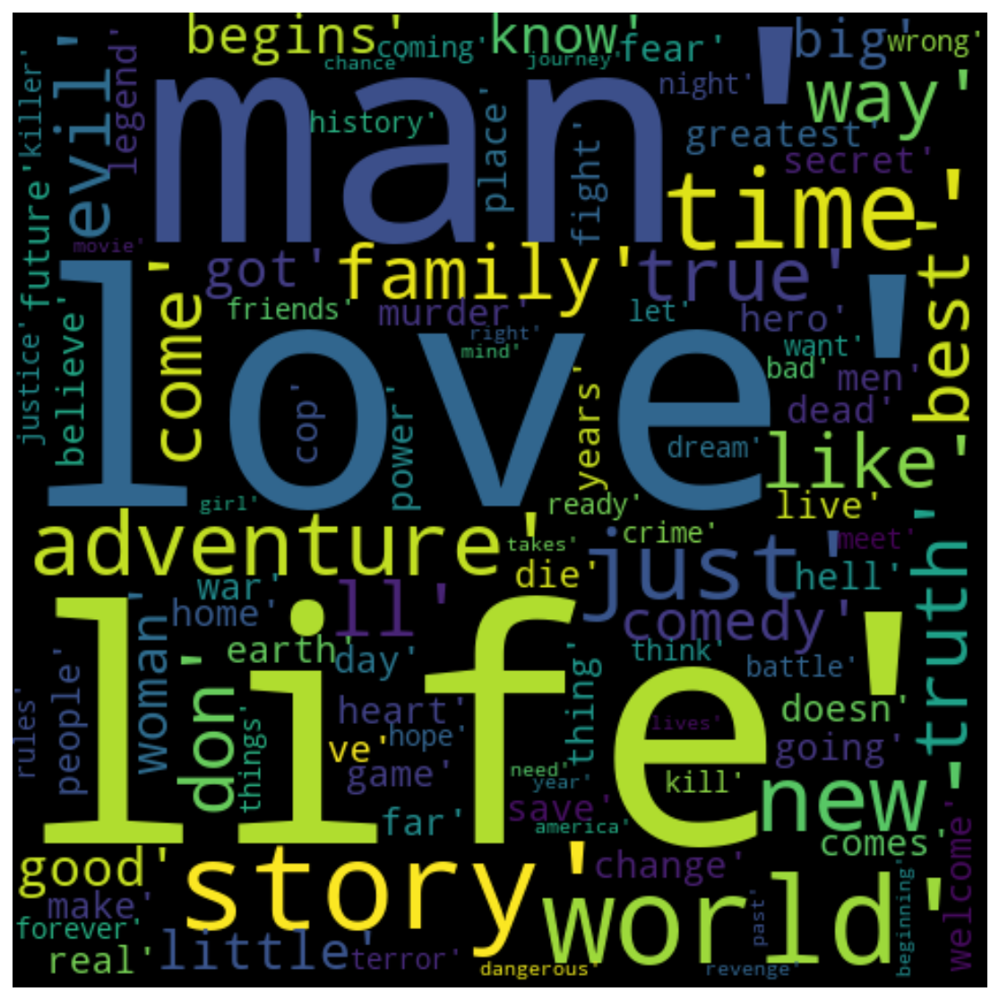

In [166]:
wordcloud = WordCloud(width=480, height=480, margin=0).generate(str(text))

plt.figure(figsize=(10,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

As we can see from the Word Cloud, Love and Life are very much present in the taglines and therefore always a "good investment". Comedy also comes in quite often, as well as man.

# 7. Results Review

I would like to continue analytics with vote and popularity, add data with webscrapping, as well as a recommendation method on rating. I would also like to present my EDA on Tableau, as well as fit further models on Classification and NLP.

In order to get even better results, we would need to collect further data. For the purposes of this project, time was limited. 